In [1]:
from IPython.core.display import HTML,display
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import pandas as pd
import numpy as np
np.corrcoef([0,1], [0,2])
import bioformats as bf
import os
import islets
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'
from scipy.stats import distributions as dst

plt.rcParams["animation.embed_limit"] = 200

/home/srdjan/github/Physio_Ca/islets/numeric.py:320: UserWarning: Did not manage to fit the decay.
  warnings.warn("Did not manage to fit the decay.")
/opt/tljh/user/envs/physio_dev/lib/python3.7/site-packages/scipy/optimize/minpack.py:829: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)
/home/srdjan/github/Physio_Ca/islets/numeric.py:320: UserWarning: Did not manage to fit the decay.
  warnings.warn("Did not manage to fit the decay.")
/home/srdjan/github/Physio_Ca/islets/numeric.py:320: UserWarning: Did not manage to fit the decay.
  warnings.warn("Did not manage to fit the decay.")
/home/srdjan/github/Physio_Ca/islets/numeric.py:320: UserWarning: Did not manage to fit the decay.
  warnings.warn("Did not manage to fit the decay.")
/home/srdjan/github/Physio_Ca/islets/numeric.py:225: RuntimeWarning: overflow encountered in exp
  return bottom+(top-bottom)*np.exp(-time*rate)
/home/srdjan/github/Physio_Ca/islets/numeric.py:225: RuntimeWarn

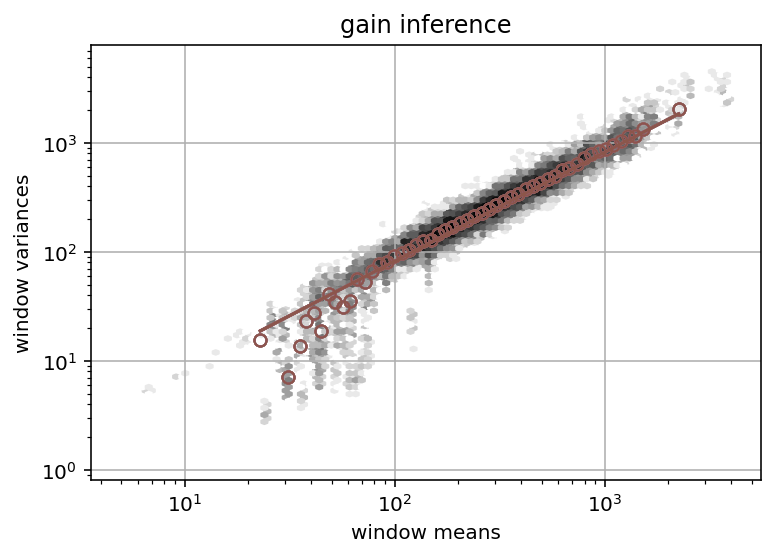

<Figure size 7560x432 with 0 Axes>

In [4]:
# from islets import PicklePicker
# pp = PicklePicker("/data/Sandra/2019/2019_11_11/Experiment40a.lif",)
# pp.show()

# pathToPickle = "/data/Sandra/2019/2019_11_11/Experiment40b.lif_analysis/Series008-9/3.4_rois.pkl" ## very stable
pathToPickle = "/data/Sandra/2020/2020_05_29/Experiment51b.lif_analysis/Series008-9_0-2700s/6.7_rois.pkl"
regions = islets.load_regions(pathToPickle, calcInterest=False, plot=True)

In [5]:
# Experiment = regions.pathToRois.split("_analysis")[0]
# Series     = regions.pathToRois.split("_analysis")[1].split("/")[1]
# bf.javabridge.start_vm(class_path=bf.JARS)
# rec = Recording(Experiment)
# rec.import_series(Series)
# regions.movie = cmovie(rec.Series[Series]["data"], fr=rec.Series[Series]["metadata"]['Frequency'])
# #### VERY STABLE!!! 

In [6]:
from copy import deepcopy
regions0 = deepcopy(regions)

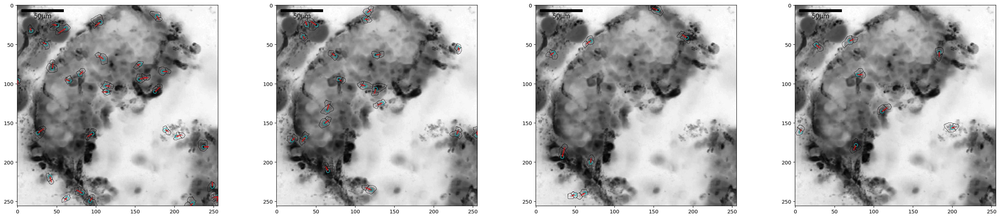

In [7]:
regions.merge_closest(plot=True, mergeDist=2)

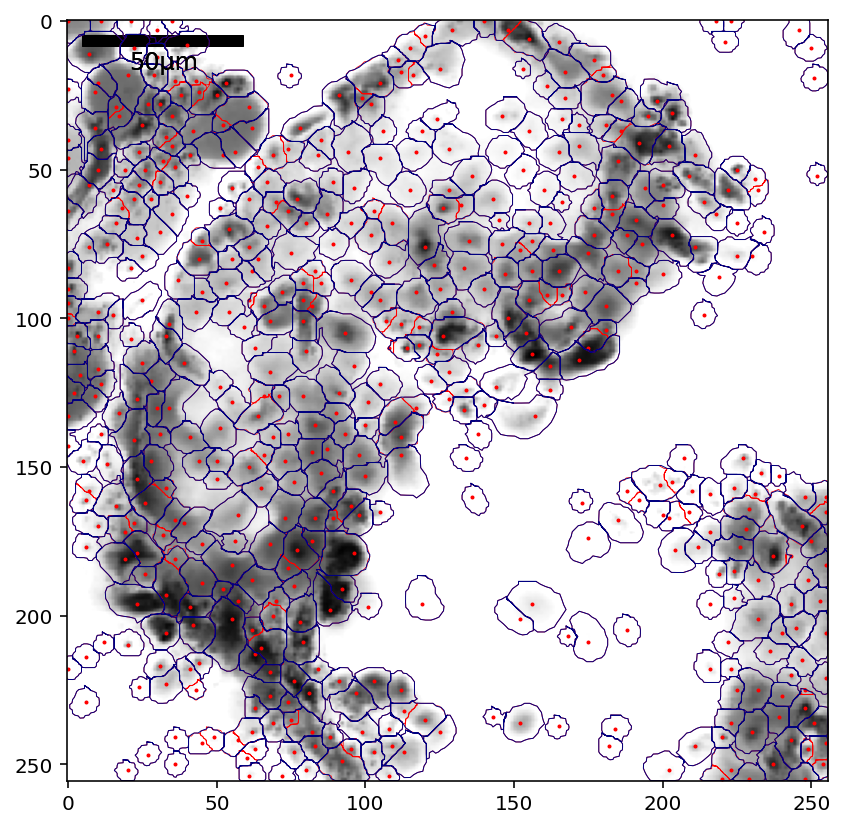

In [8]:
plt.figure(figsize=(7,7))
ax = plt.subplot(111)
regions0.plotEdges(ax=ax,color="r",lw=.4)
regions0.plotPeaks(ax=ax,color="r")
regions.plotEdges(ax=ax, image=False, color="navy")

In [9]:
len(regions.df), len(regions0.df), 

(454, 521)

In [10]:
del regions0

In [11]:
# from scipy.stats import median_abs_deviation

# pks, pkv = regions.reassign_peaks(regions.statImages["highperc"], write=False)
# x = np.log10(pkv)
# plt.hist(x,50);
# med = np.median(x)
# plt.axvline(med,color="red",ls="--")
# pkv_th = med-median_abs_deviation(x)*1.5
# plt.axvline(pkv_th,color="red")

In [12]:
# handpicked_indices = np.loadtxt("51b_s8-9.txt", dtype=int)
# regions.df = regions.df.loc[handpicked_indices]
# regions.update()

In [13]:
# regions.examine()

In [37]:
s,f,z = regions.fast_filter_traces(10,z_sp=0, write=False, normalize=False, Npoints=np.inf, verbose=True)

Nrebin = 1


In [38]:
sigmean = np.mean(z>=3,1)

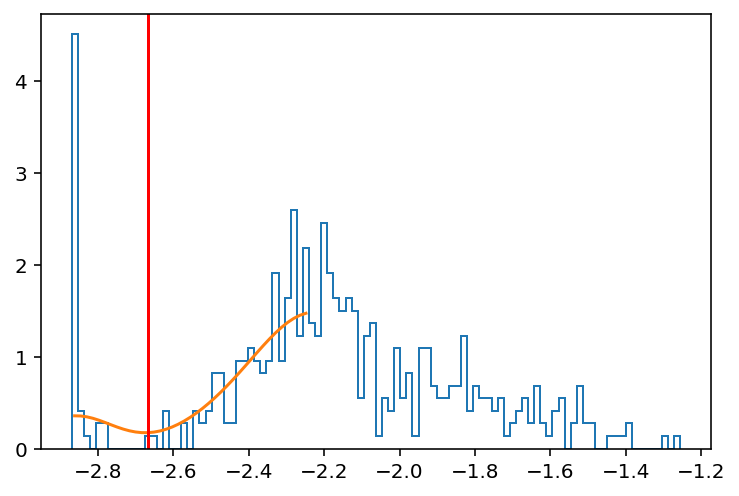

In [39]:
sigmean_th = islets.numeric.get_sep_th(sigmean+dst.norm.cdf(-3), plot=True, log=True)
sigmean_th = max(dst.norm.cdf(-3), sigmean_th)
plt.axvline(np.log10(sigmean_th),color="r")

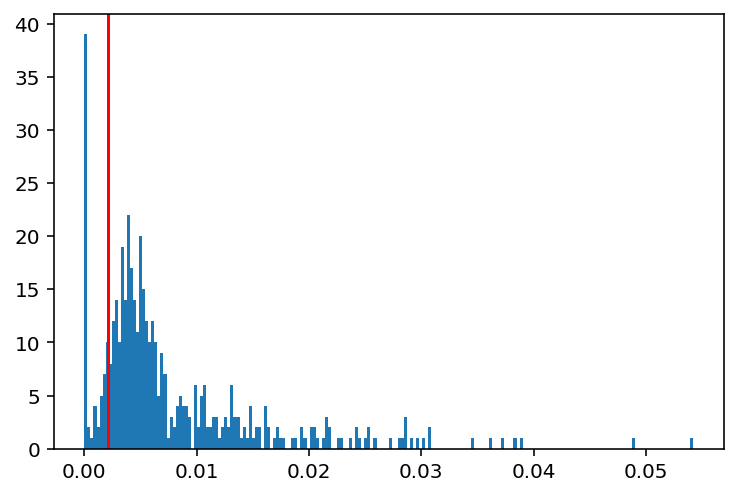

In [40]:
plt.hist(sigmean,200);
# plt.axvline(dst.norm.cdf(-3),color="r")
plt.axvline(sigmean_th, color="red")
# plt.xlim(0,.05)

In [41]:
toDel = regions.df.index[sigmean<sigmean_th]
# # if you wish to check who will be deleted:
regions.examine(startShow=toDel)

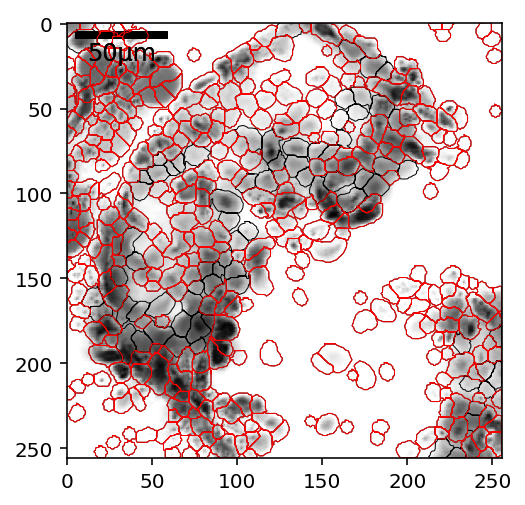

In [26]:
ax = plt.subplot(111)
regions.plotEdges(ax=ax, color="k")
regions.plotEdges(ax=ax, color="r", image=False, ix=toDel)

In [ ]:
regions.df.drop(index=toDel, inplace=True)
regions.update()

In [42]:
regions.gain

0.8212798300611803

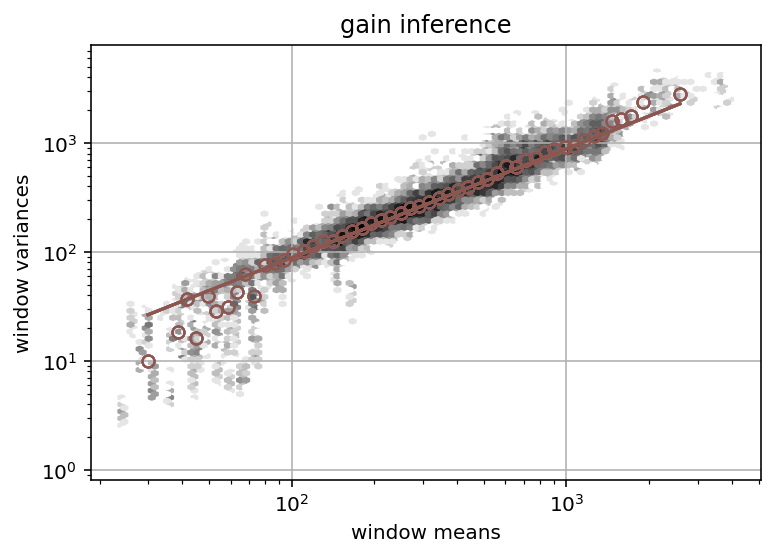

In [43]:
regions.infer_gain(plot=True)

In [44]:
regions.gain

0.8837659910462115

In [46]:
regions.gain = 1

In [47]:
t = regions.time#regions.showTime.get(k, regions.time)

In [48]:
from islets.utils import multi_map

In [49]:
from islets.fitting import generic_function

In [50]:
# plt.plot(np.vstack(regions.df.trend)[:,::100].T,lw=.4);
# regions.df.shape
# regions.df["trend_max"] = regions.df.trend.apply(np.max)
# plt.hist(regions.df.trend_max,100);
# regions.df = regions.df.query(f"trend_max>3.5").copy()
# regions.update()

In [51]:
regions.df.shape

(454, 12)

#### New

In [52]:
def shave_fitted(spikeDF_):
    spikeDF_["err"] = None
    spikeDF_["snr"] = None
    for _, spike in spikeDF_.iterrows():
        i0 = max(0,np.searchsorted(t, spike["t0"]-spike.halfwidth)-1)
        ie = min(np.searchsorted(t, spike["t0"]+3*spike.halfwidth)+2,len(t))
#         x = regions.df.loc[spike.roi,currcol]
        xs = regions.df.loc[spike.roi,currcol.replace("trace","slower")]
        x_fit, bkg = generic_function(spike.fshape, spike.pars, t[i0:ie], fillnan=False, bkgsum=False)
        good = np.abs(np.diff(x_fit))>x_fit.std()/10
        if not good.any():
            spikeDF_.loc[_, "err"] = "empty"
            continue
        j0, je = np.where(good)[0][[0,-1]]
        imax = np.argmax(x_fit)
        noise = bkg[imax]*regions.gain/regions.df.loc[spike.roi,"size"]
        noise = noise**.5
        spikeDF_.loc[_, "snr"] = x_fit[imax]/noise
#         if x_fit[imax]<=bkg[imax]:
#             spikeDF_.loc[_, "err"] = "steep"
        je += 1
#         xfit = generic_function(spike.fshape, spike.pars, t[i0:ie], fillnan=True)
#         ie = i0 + np.where(np.isfinite(xfit))[0][-1]+2
#         i0 += np.where(np.isfinite(xfit))[0][0]+1
#         corr = np.interp(t[i0:ie], [t[i0],t[ie]], xfit[np.isfinite(xfit)][[0,-1]])
#         j0 = np.where(np.isfinite(xfit))[0][0]
#         je = np.where(np.isfinite(xfit))[0][-1]
#         xfit[j0:je].std()/10
#         corr = np.interp(t[i0+j0:i0+je], [t[i0+j0],t[i0+je]], [xs[j0],xs[je]] )
#         if (~np.isfinite(corr)).any():
#             print ("oops")
#             continue
#         regions.df.loc[spike.roi,currcol][i0+j0:i0+je] = xs[i0+j0:i0+je]
        regions.df.loc[spike.roi,currcol][i0+j0:i0+je] = bkg[j0:je]
    return None

In [53]:
def subf_(row):
    df_ = pd.DataFrame([row])
    slowk = "slower_%g"%ts
    if slowk in regions.df.columns:
        xslow = regions.df.loc[int(row.roi),slowk]
    else:
        xslow = None
    out = islets.fit_spikes(t,
                            regions.df.loc[int(row.roi),"trace"], 
                            df_, 
                            xslow,
#                             z_score_th = 3
                           )
    if "pars" in out.columns:
        out.pars = out.pars.apply(tuple)
    out["roi"] = [int(row.roi)]*len(out)
    return out

In [54]:
def shave_spikes(spikeDF_):
    for _, spike in spikeDF_.iterrows():
        i0 = np.searchsorted(t, spike.t0-spike.halfwidth*.3)
        ie = np.searchsorted(t, spike.t0+spike.halfwidth*1.)
        x = regions.df.loc[spike.roi,currcol]
        xs = regions.df.loc[spike.roi,currcol.replace("trace","slower")]
        corr = np.interp(t[i0:ie], [t[i0],t[ie]], [xs[i0],xs[ie]])
#         corr = np.interp(t[i0:ie], [t[i0],t[ie]], [min(xs[i0], np.mean(x[i0-1:i0+2])),min(xs[ie], np.mean(x[ie-1:ie+2]))])
#         corr = np.interp(t[i0:ie], [t[i0],t[ie]], [x[i0],x[ie]])
        x[i0:ie] = corr
    return None

In [126]:
regions.reset_filtered()
for col in regions.df.columns:
    if "trace_" in col:# and ".5" not in col:
        del regions.df[col]
if hasattr(regions,"spikes"):
    del regions.spikes

In [56]:
regions.detrend_traces("simple")

In [57]:
timescales = 2.**np.arange(-1,20)
timescales = timescales[timescales<regions.time[-1]/5]
timescales

array([5.00e-01, 1.00e+00, 2.00e+00, 4.00e+00, 8.00e+00, 1.60e+01,
       3.20e+01, 6.40e+01, 1.28e+02, 2.56e+02, 5.12e+02])

In [58]:
from scipy.stats import median_abs_deviation

In [59]:
zcorrs = []
for ts in [.125,.25,.5][-1:]:
    k = "%g"%ts
    z = regions.fast_filter_traces(ts, z_sp=0, write=False)[-1]
    zcorrs += [median_abs_deviation(z, scale="normal", axis=1)]
zcorrs = np.array(zcorrs)
regions.df["correctZ"] = zcorrs[np.argmin(np.abs(zcorrs-1),0),np.arange(zcorrs.shape[1])]

In [60]:
%matplotlib inline

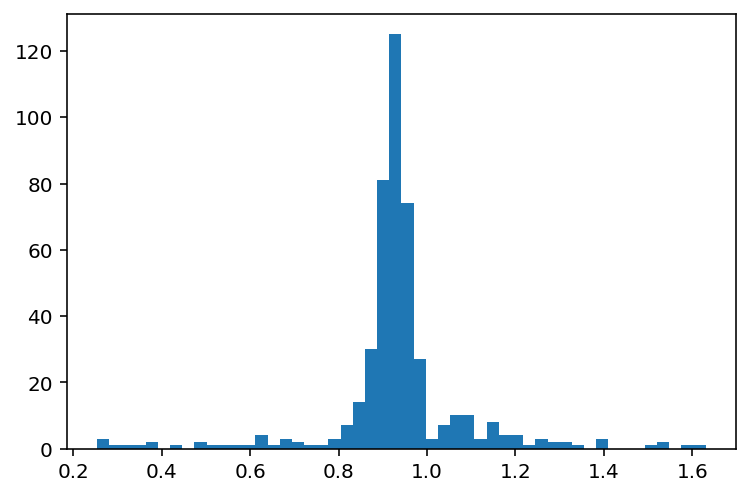

In [127]:
plt.hist(regions.df.correctZ,50);

In [62]:
def coltrans(x, vmin=None, vmax=None, tilt=1, offset=0.1):
    try:
        x[0]
        iterable = True
        if vmax is None:
            vmax = islets.numeric.robust_max(x)
        if vmin is None:
            vmin = -islets.numeric.robust_max(-x)
    except:
        iterable = False
        x = np.array([x])
    y = np.log(np.clip(x,vmin,vmax))**(1./tilt)
    if iterable:
        y -= y.min()
        y /= y.max()
#         y = np.minimum(offset+y,y.max())
        y = np.sqrt(offset**2+y**2)
        y /= y.max()
        return y
    else:
        return y[0]

In [125]:
smooth = None
z_sp = 0
z_th = 3

In [128]:
%matplotlib inline
allSpikes = []
for its, ts in enumerate(timescales):
    k = "%g"%ts
    print (f"ts = {ts}s")
    regions.fast_filter_traces(ts, z_sp=z_sp, verbose=True,Npoints=np.inf)
    regions.df["zScore_"+k] = [regions.df.loc[ix,"zScore_"+k]/regions.df.loc[ix,"correctZ"] for ix in regions.df.index]
    regions.calc_spikes(ts,z_th=z_th, smooth=smooth, verbose=True)
    spikeDF = regions.spikes[k]
    spikeDF = spikeDF.query(f"halfwidth<{ts*.7}")
    spikeDF["ts"] = ts
    spikeDF["its"] = its
    for ttmp in allSpikes:
        spikeDF.index += len(ttmp.index)
    allSpikes += [spikeDF]

ts = 0.5s
Nrebin = 1
ts = 1.0s
Nrebin = 1
smoothing with kernel 3
ts = 2.0s
Nrebin = 1
smoothing with kernel 7
ts = 4.0s
Nrebin = 1
smoothing with kernel 15
ts = 8.0s
Nrebin = 1
smoothing with kernel 31
ts = 16.0s
Nrebin = 1
smoothing with kernel 63
ts = 32.0s
Nrebin = 1
smoothing with kernel 127
ts = 64.0s
Nrebin = 1
smoothing with kernel 253
ts = 128.0s
Nrebin = 1
smoothing with kernel 507
ts = 256.0s
Nrebin = 1
smoothing with kernel 1013
ts = 512.0s
Nrebin = 1
smoothing with kernel 2027


In [129]:
allSpikes = pd.concat(allSpikes[:])
allSpikes["loghalfwidth"] = np.log10(allSpikes["halfwidth"])
allSpikes["color"] = list(plt.cm.hot(coltrans(allSpikes.height, vmax=10)))
allSpikes["score"] = coltrans(allSpikes.height)
allSpikes["logheight"] = np.log10(allSpikes.height)

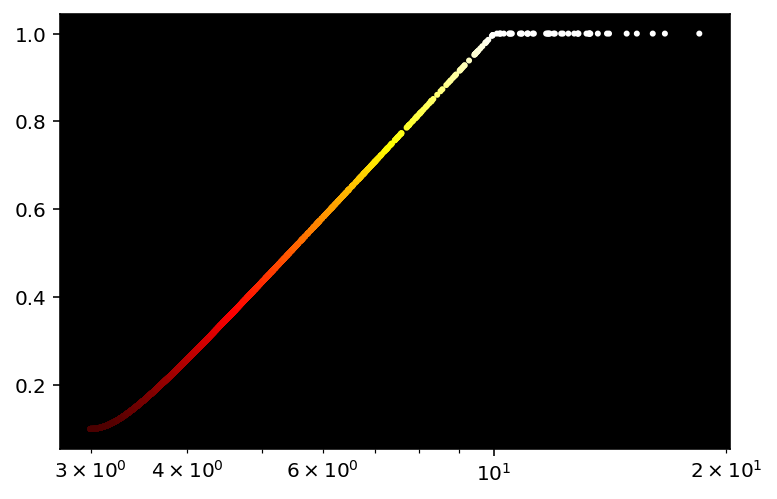

In [130]:
ax = plt.subplot(111)
ax.set_facecolor("k")
y = coltrans(allSpikes.height, vmax=10)
plt.scatter(allSpikes.height, y,c = plt.cm.hot(y),s=4, )
plt.xscale("log")

In [131]:
# roi = 379
showdf = allSpikes#.query(f"ts=={timescales[-1]} and roi=={roi}")
regions.examine_spikesdf(showdf,cols=["loghalfwidth","height"])

In [132]:
# regions.calc_spikes(ts,z_th=1, smooth=smooth, verbose=False)
# spikeDF = regions.spikes[k]
# spikeDF["loghalfwidth"] = np.log10(spikeDF["halfwidth"])
# spikeDF["logheight"] = np.log10(spikeDF.height)
# # regions.examine_spikesdf(
# #     spikeDF,#.query(f"roi=={roi}"),
# #     cols=["halfwidth","height"]
# # )

In [133]:
# for ts in timescales:
#     k = "%g"%ts
#     regions.fast_filter_traces(ts,z_sp=0, verbose=True, Npoints=np.inf)
# #     regions.df["zScore_"+k] = [regions.df.loc[ix,"zScore_"+k]/regions.df.loc[ix,"correctZ"] for ix in regions.df.index]
#     regions.df["z_std_"+k] = regions.df["zScore_"+k].apply(lambda xi: median_abs_deviation(xi, scale="normal"))

In [134]:
# nrebins = [1,1,3,5,11,21,42,84,169,338,676]

In [135]:
# # plt.plot(nrebins, [regions.df["z_std_%g"%ts].median() for ts in timescales],".-")
# plt.plot(timescales, [regions.df["z_std_%g"%ts].median() for ts in timescales],".-")
# plt.xscale("log")
# # plt.yscale("log")

In [136]:
# for ts in timescales:
#     k = "%g"%ts
#     x = regions.df["z_std_"+k].values
#     plt.plot(sorted(x),np.arange(len(x)))
# #     plt.hist(x,50, histtype="step", log=True)
# plt.xscale("log")

In [137]:
# plt.hist(regions.df.loc[450,"zScore_512"],100);

In [138]:
maxH = allSpikes.query("ts>=3 and ts<100").groupby("roi").height.apply(lambda xi: np.percentile(xi,99))
medH = allSpikes.query("ts>=3 and ts<100").groupby("roi").height.median()

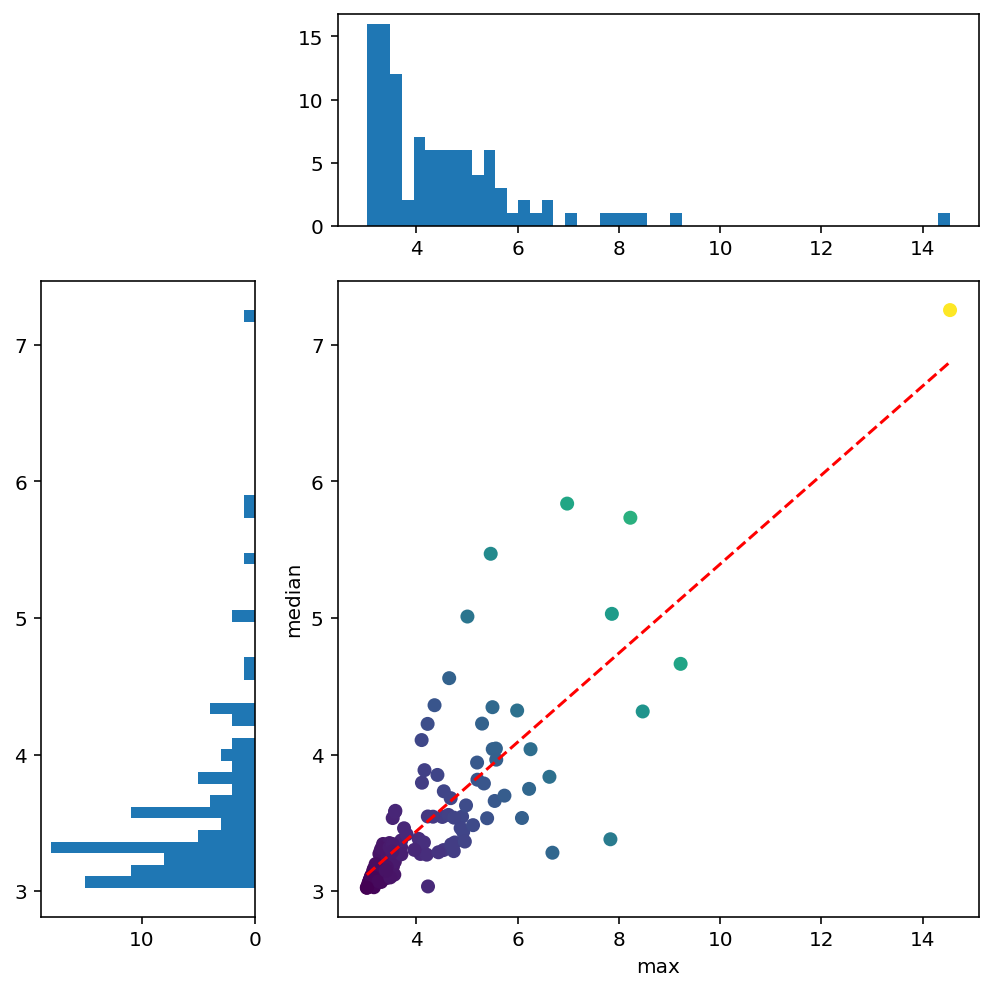

In [139]:
fig, axs = plt.subplots(2,2,gridspec_kw=dict(height_ratios=(1,3), width_ratios=(1,3)), figsize=(7,7))
# plt.hist(medH,100);
axs[0,0].remove()
axs[0,1].hist(maxH,50)
axs[1,1].set_xlabel("max",)
axs[1,1].set_ylabel("median",)
axs[1,0].hist(medH,50, orientation="horizontal")
axs[1,0].set_xlim(axs[1,0].get_xlim()[::-1])
k, n = np.polyfit(maxH, medH, 1)
transx = maxH*k+n
plt.plot(maxH.sort_values().iloc[[0,-1]], transx.sort_values().iloc[[0,-1]],"r--")
d2n = (medH-n)**2+(transx)**2
axs[1,1].scatter(maxH, medH,c=np.log(d2n))
plt.tight_layout()

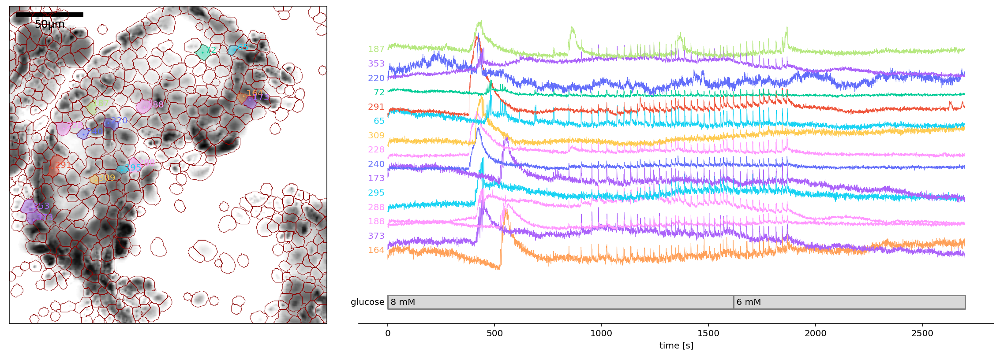

In [140]:
candidateNoise = list(d2n.sort_values().index[:15])
regions.plotTraces(candidateNoise, Offset=2, )

In [141]:
# gini = []
# for roi, dfr in allSpikes.query("ts>=3 and ts<100").groupby("roi"):
#     x = np.minimum(dfr.height.values,100)
#     x = np.log(x)
#     gini += [.5*median_abs_deviation(x)/np.mean(x) ]
# plt.hist(gini,50,);

In [142]:
# ir = 0
# for roi in regions.df.index[np.argsort(gini)]:
# # for roi in allSpikes.roi.value_counts().index[:]:
#     df = allSpikes.query(f"roi=={roi} and ts>=3 and ts<100")
#     x = df.height.values
#     x.sort()
#     y = np.linspace(0,1,len(x))
#     plt.plot(x,y,color=plt.cm.rainbow(ir/len(regions.df)),lw=.7 if roi in candidateNoise else .1)
#     ir += 1
# plt.xscale("log")

In [143]:
# %matplotlib inline
# for roi in [220]:
# # for roi in regions.df.index[np.argsort(gini)][:10]:
# # for roi in allSpikes.roi.value_counts().index[:5]:
#     df = allSpikes.query(f"roi=={roi}")
#     fig, ax = plt.subplots(1,1,figsize=(10,5), sharex=True)

#     for its, ts in enumerate(timescales):
#         dfts = df.query(f"ts=={ts}")
#         for _, row in dfts.iterrows():
#             ax.fill(row.t0+row.halfwidth*np.array([0,0,1,1,0]),its+np.array([0,1,1,0,0])*.8-.5, color=row.color, linewidth=.7)
# #             ax.text(row.t0+row.halfwidth/2,its, "%.2g"%row.height, color="darkgrey", va="center", ha="center")
# #             break

#     ax.set_facecolor("k")
#     ax.set_yticks(np.arange(len(timescales)));
#     ax.set_yticklabels(timescales);
#     n = 5
#     ax.plot(islets.numeric.rebin(regions.time, n), islets.numeric.rebin(regions.df.loc[roi,"trace"]+len(timescales)*.3, n),c="grey", lw=.7)
# #     plt.savefig(f"{roi}.png",dpi = 150)
# #     plt.close(fig)

In [144]:
# candidateNoise.remove(220)

In [145]:
# regions.df.drop(index=candidateNoise, inplace=True)
# regions.update()

#### Try to process the best trace:

<IPython.core.display.Javascript object>


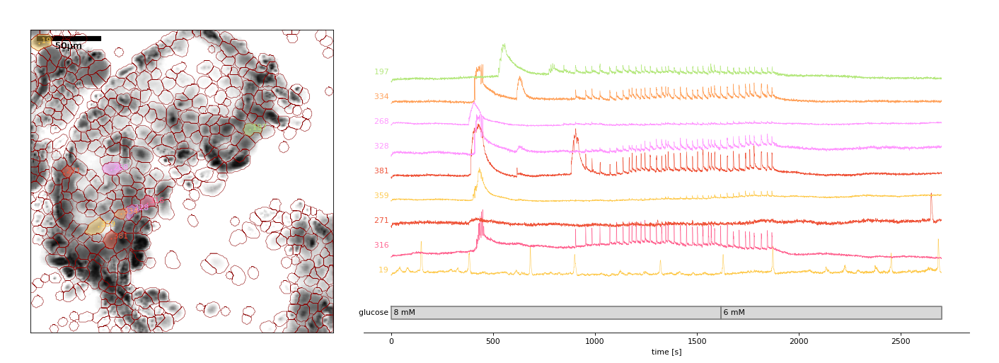

In [160]:
regions.plotTraces(d2n.sort_values().index[-1:-10:-1])

In [161]:
roi = d2n.sort_values().index[-2]

In [162]:
def shave_spikes_single(spikeDF_,x,xs):
    for _, spike in spikeDF_.iterrows():
        i0 = np.searchsorted(t, spike.t0-spike.halfwidth)
        ie = np.searchsorted(t, spike.t0+spike.halfwidth*1.2)
        corr = np.interp(t[i0:ie], [t[i0],t[ie]], [xs[i0],xs[ie]])
#         corr = np.interp(t[i0:ie], [t[i0],t[ie]], [min(xs[i0], np.mean(x[i0-1:i0+2])),min(xs[ie], np.mean(x[ie-1:ie+2]))])
#         corr = np.interp(t[i0:ie], [t[i0],t[ie]], [x[i0],x[ie]])
        x[i0:ie] = corr
    return None

In [163]:
origtrace = regions.df.loc[roi,"trace"].copy()
# tstraces = {ts: origtrace.copy() for ts in timescales}

In [169]:
sosFilters = {}
for ts in timescales:
    regions.fast_filter_traces(ts, z_sp=z_sp, verbose=False,write=False, Npoints=np.inf)
    sosFilters[ts] = deepcopy(regions.sosFilter)

tsslows = {ts: sosFilters[ts].run(origtrace) for ts in timescales}

In [166]:
t = regions.time

<IPython.core.display.Javascript object>


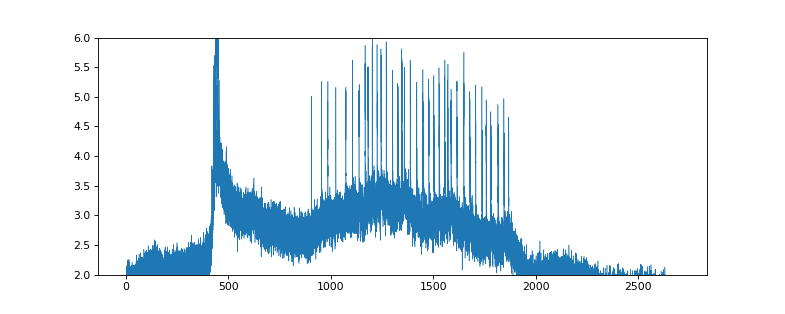

(2.0, 6.0)

In [167]:
plt.figure(figsize=(10,4))
plt.plot(t, origtrace,lw=.5)
# for ts in timescales:
#     plt.plot(t, tsslows[ts],lw=.7)
# plt.xlim(xl)
plt.ylim(2,6)

In [151]:
import networkx as nx

In [152]:
%matplotlib inline

Text(0.5, 0, 'freq')

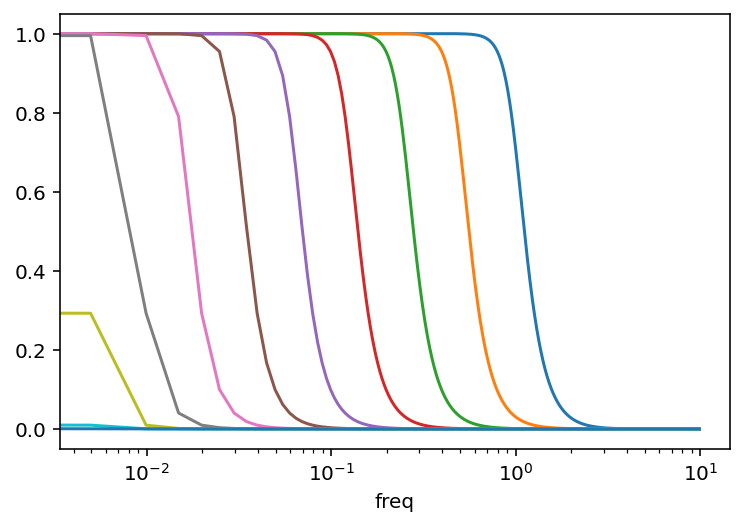

In [153]:
for ts in sosFilters:
    plt.plot(*sosFilters[ts].get_shape(),label=ts)
plt.xscale("log")
# plt.legend(loc=3)
plt.xlabel("freq")

In [171]:
# whole
%matplotlib notebook
xl = 0,regions.time[-1]
df = allSpikes.query(f"roi=={roi} and t0>{xl[0]} and t0<{xl[1]}").copy()
df["status"] = "ok"

fig, axs = plt.subplots(2,1,figsize=(13,14), sharex=True, sharey=True)
ax = axs[0]
offset = len(timescales)*.0-4
ax.plot(t, origtrace+offset,c="grey", lw=.7)
# n = 10
# ax.plot(islets.numeric.rebin(t,n), islets.numeric.rebin(origtrace,n)+offset,c="red", lw=.7)
for its, ts in enumerate(timescales[:]):
    dfts = df.query(f"ts=={ts}")
    for ix, row in dfts.iterrows():
        ax.fill(
            row.t0+row.halfwidth*np.array([0,0,1,1,0]),
            its+np.array([0,1,1,0,0])*.8-.5,
            color=row.color,
            linewidth=.7,
            edgecolor="k"
        )
for its, ts in enumerate(timescales[:]):
#     ax.plot(t, tsslows[ts]+offset, lw=.7)
#     ax.plot(t, tstraces[ts]+offset,c="grey", lw=.7)
    dfts = df.query(f"ts=={ts}")
    for ix, row in dfts.iterrows():
        it0 = np.searchsorted(t,row.t0)-1
        ite = np.searchsorted(t,row.t0+row.halfwidth)+1
        spikeLength = ite-it0
        if spikeLength<3:
            print (f"{its} is less than 1/freq!?")
        ddslow = np.diff(np.diff(tsslows[ts][it0:ite]))
#         ddorig = np.diff(np.diff(origtrace[it0:ite]))
        if spikeLength>10 and ddslow.mean()>0:
#         if ddorig.mean()>0:
            ax.text(row.t0+row.halfwidth/2, its+.3, "x", va="bottom", ha="center")
            df.loc[ix,"status"] = "spurious"
        tcur = t[it0:ite]
        bkg = tsslows[ts][it0]+np.arange(spikeLength)*(tsslows[ts][ite]-tsslows[ts][it0])/(spikeLength-1)
#         c = ax.plot(t[it0:ite], bkg+offset)[0].get_color()
        purePeak = origtrace[it0:ite]-bkg
        amplitude = islets.numeric.robust_max(purePeak, Nlast=spikeLength//10)
#         if spikeLength<10:
#             amplitude = purePeak.max()
#         else:
# #             amplitude = purePeak.max()
#             amplitude = -np.argpartition(-purePeak, spikeLength//10)[:spikeLength//10].mean()
        if amplitude<1.*np.abs(bkg[-1]-bkg[0]):
            ax.text(row.t0+row.halfwidth/2, its+.3, ("/" if bkg[-1]>bkg[0] else "\\"), va="bottom", ha="center")
            df.loc[ix,"status"] = "steep"
        #ax.text(row.t0+row.halfwidth/2,its, "%.2g"%row.height, color="darkgrey", va="center", ha="center")

# ax.set_facecolor("k")
# ax.set_xlim(xl)

df["tend"] = df.t0+df.halfwidth

df = df.query("status=='ok'")

g = nx.DiGraph()
for isp, spike in df.sort_values("halfwidth").iterrows():
    conflicts = df.query(       f"t0>{spike.t0-spike.halfwidth*.33}")
    conflicts = conflicts.query(f"t0<{spike.t0+spike.halfwidth*.33}")
    conflicts = conflicts.query(       f"tend>{spike.tend-spike.halfwidth*.33}")
    conflicts = conflicts.query(f"tend<{spike.tend+spike.halfwidth*.33}")
#     conflicts = conflicts.query(f"halfwidth<{spike.halfwidth*1.5}")
#     conflicts = conflicts.query(f"halfwidth>{spike.halfwidth*.67}")
    conflicts = conflicts.query(f"index!={spike.name}")
    g.add_node(isp)
    for other in list(conflicts.index):
        g.add_edge(isp, other)
        

nx.draw_networkx(g,
                 ax=ax,
                 with_labels=False,
                 pos={node: (df.loc[node, "t0"]+.5*df.loc[node, "halfwidth"], df.loc[node, "its"]) for node in g.nodes},
                 node_size=0,
                 edge_color="grey"
                )
ax.set_yticks(np.arange(len(timescales)));
ax.set_yticklabels(timescales);
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
######################################################
df_filt = []
for ixs in nx.connected_components(g.to_undirected()):
    row = pd.Series(df.loc[list(ixs)].sort_values("height").iloc[-1])
    for col in ["t0","tend","height"]:
        row.col = df.loc[list(ixs),col].mean()
    row.halfwidth = row.tend-row.t0
    df_filt += [row]
df_filt = pd.DataFrame(df_filt)
for col in ["loghalfwidth","score","status","color"]:
    del df_filt[col]
df_filt["color"] = list(plt.cm.hot(coltrans(df_filt.height, vmax=10)))
ax = axs[1]
ax.plot(t, origtrace+offset,c="grey", lw=.7)
for its, ts in enumerate(timescales[:]):
    dfts = df_filt.query(f"ts=={ts}")
    for ix, row in dfts.iterrows():
        ax.fill(
            row.t0+row.halfwidth*np.array([0,0,1,1,0]),
            its+np.array([0,1,1,0,0])*.8-.5,
            color=row.color,
            linewidth=.7,
            edgecolor="k"
        )

# ax.set_facecolor("k")
ax.set_yticks(np.arange(len(timescales)));
ax.set_yticklabels(timescales);
ax.set_xlim(xl)

<IPython.core.display.Javascript object>

(0.0, 2699.89898989899)

<IPython.core.display.Javascript object>


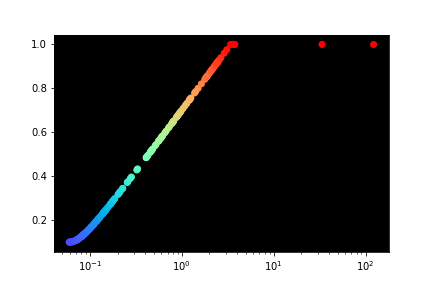

In [203]:
plt.figure()
ax = plt.subplot(111)
ax.set_facecolor("k")
x = df_filt.halfwidth.values
y = coltrans(x)
df_filt["coltrans"] = y
df_filt.color = list(plt.cm.rainbow(y))
plt.scatter(x,y,
    c = df_filt.color
)
plt.xscale("log")

<IPython.core.display.Javascript object>


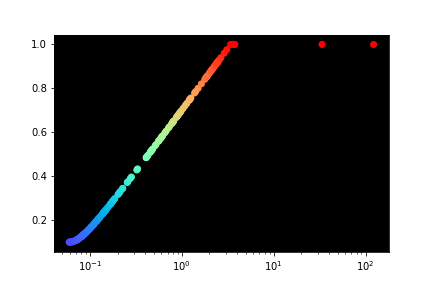

In [203]:
plt.figure()
ax = plt.subplot(111)
ax.set_facecolor("k")
x = df.halfwidth.values
y = coltrans(x)
df_filt["coltrans"] = y
df_filt.color = list(plt.cm.rainbow(y))
plt.scatter(x,y,
    c = df_filt.color
)
plt.xscale("log")

<IPython.core.display.Javascript object>


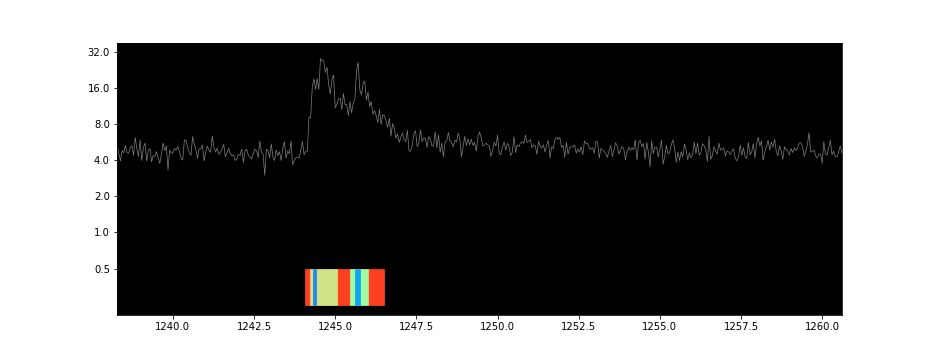

(0.0, 2699.89898989899)

In [208]:
fig, ax = plt.subplots(1,1,figsize=(13,5))
ax.plot(t, origtrace,c="grey", lw=.7)
for i,ts in enumerate(timescales[::-1]):
    dfts = df_filt.query(f"ts=={ts}")
    for ix, row in dfts.iterrows():
        ax.fill(
            row.t0+row.halfwidth*np.array([0,0,1,1,0]),
            -np.array([0,1,1,0,0]),#*(np.log(row.halfwidth+.5)-np.log(.5)),
#             -np.array([0,1,1,0,0])*(np.log(row.halfwidth+.5)-np.log(.5)),
#             -np.array([0,1,1,0,0])*row.coltrans,
            color=row.color,
            linewidth=.7,
#             edgecolor="k"
        )

ax.set_facecolor("k")
ax.set_yticks(np.arange(len(timescales)));
ax.set_yticklabels(timescales);
ax.set_xlim(xl)

{45510, 64062}

#### Try all of them:

In [260]:
df[df.retain].conflicts.apply(lambda xi: xi.get_index())

AttributeError: 'float' object has no attribute 'get_index'

In [246]:
conflicts.append(spike)

,height,halfwidth,t0,roi,ts,loghalfwidth,color,score,retain,tend,conflicts
45510,3.770757,0.194793,1271.315261,316,1.0,-0.710426,"[0.5975215789394817, 0.0, 0.0, 1.0]",0.115956,True,1271.510054,NaN
20157,3.227384,0.129570,1271.327690,316,0.5,-0.887496,"[0.3401504775786106, 0.0, 0.0, 1.0]",0.101306,True,1271.457259,NaN


In [234]:
spike.

height                                       3.39282
halfwidth                                    0.11007
t0                                           1270.98
roi                                              316
ts                                               0.5
loghalfwidth                                -0.95833
color           [0.41221438595965454, 0.0, 0.0, 1.0]
score                                       0.104534
retain                                          True
Name: 20156, dtype: object

In [215]:
shave_spikes_single(dfts[dfts.retain], tstraces[ts], tsslows[ts])

In [121]:
its = 3V

In [122]:
ts = timescales[its]
print (ts)
dfts = df.query(f"ts=={ts}")
dfts

4.0


,height,halfwidth,t0,roi,ts,loghalfwidth,color,score
79152,13.933322,2.324074,1269.817492,316,4.0,0.366250,"[1.0, 1.0, 1.0, 1.0]",0.412042
79153,9.525218,0.655209,1271.006114,316,4.0,-0.183620,"[1.0, 1.0, 0.8455880808821985, 1.0]",0.316846
79154,15.656233,1.686590,1300.138267,316,4.0,0.227010,"[1.0, 1.0, 1.0, 1.0]",0.441560
79155,3.012997,1.052551,1306.717749,316,4.0,0.022243,"[0.2989711013608711, 0.0, 0.0, 1.0]",0.099510
79156,11.908294,1.257258,1326.195220,316,4.0,0.099425,"[1.0, 1.0, 1.0, 1.0]",0.372492
79157,7.624944,0.818920,1328.057963,316,4.0,-0.086758,"[1.0, 1.0, 0.1198520610285317, 1.0]",0.262471
79158,3.139501,0.771416,1333.831424,316,4.0,-0.112711,"[0.31956078946974087, 0.0, 0.0, 1.0]",0.100205
79159,13.411590,2.151293,1345.630773,316,4.0,0.332700,"[1.0, 1.0, 1.0, 1.0]",0.402406


In [123]:
%matplotlib notebook

In [124]:
fittedSpikes = islets.fit_spikes(
    t = regions.time,
    y = tstraces[ts],
    spikeDf = dfts,
    y_slow = tsslows[timescales[its+1]],)

fittedSpikes["chi2"] =[fitrow.chi2_raw/regions.gain*regions.df.loc[roi, "size"] for isp, fitrow in fittedSpikes.iterrows()]

In [125]:
fittedSpikes

,background,chi2_raw,edges,fshape,halfwidth,pars,time,ycur,yf,t0,chi2
79152,"[3.1302425949928288, 3.1302682590754722, 3.130...",0.022252,"(1269.8025236000144, 1272.0426896347312)",myLogNorm,2.240166,"(1270.0027181032126, 2.201693716124513, 2.0023...","[1269.3434343434344, 1269.3939393939393, 1269....","[3.2699999809265137, 3.0, 3.180000066757202, 3...","[3.1302425949928288, 3.1334291992800387, 3.158...",1270.002718,2.213284
79153,"[4.986499490467219, 4.950252044972587, 4.91400...",0.013569,"(1271.1907299772574, 1272.0882143179174)",myLogNorm,0.897484,"(1271.335923546414, 0.7265324248448369, 1.1841...","[1270.7575757575758, 1270.8080808080808, 1270....","[4.760000228881836, 4.699999809265137, 4.46000...","[4.986499490467219, 4.949403619932523, 4.91643...",1271.335924,1.349677
79154,"[2.99566222904669, 2.9968213835805617, 2.99798...",0.011328,"(1300.1256835350043, 1301.8285311853654)",myLogNorm,1.702848,"(1300.2189754085975, 2.361745264312558, 1.6273...","[1299.8989898989898, 1299.949494949495, 1300.0...","[2.9800000190734863, 3.069999933242798, 3.1800...","[2.99566222904669, 3.0126293127012995, 3.23408...",1300.218975,1.126752
79156,"[3.223948732716445, 3.236374453332536, 3.24880...",0.042593,"(1326.2091595698525, 1327.3160252348314)",myLogNorm,1.106866,"(1326.399682093244, 1.4157188046077473, 1.9117...","[1325.6060606060605, 1325.6565656565656, 1325....","[2.8299999237060547, 3.0199999809265137, 3.130...","[3.223948732716445, 3.240544107392594, 3.26117...",1326.399682,4.236498
79157,"[3.87351124295271, 3.858775220174416, 3.844039...",0.010775,"(1328.087766925522, 1328.878659479677)",myLogNorm,0.790893,"(1328.1480056129203, 1.0578387397097009, 0.711...","[1327.8787878787878, 1327.9292929292928, 1327....","[3.7100000381469727, 3.799999952316284, 3.7000...","[3.87351124295271, 3.85731439009811, 3.8550009...",1328.148006,1.071741
79158,"[3.1434157845065442, 3.1487384894125117, 3.154...",0.002198,"(1334.3033650626805, 1334.465609817452)",myLogNorm,0.162245,"(1334.3347643905315, 0.26970316472451344, 1.13...","[1334.141414141414, 1334.1919191919192, 1334.2...","[3.049999952316284, 3.069999933242798, 3.18000...","[3.1434157845065442, 3.1514810961771142, 3.180...",1334.334764,0.218604
79159,"[3.0627562238596706, 3.063609743301737, 3.0644...",0.021149,"(1345.647318766979, 1347.7671993714243)",myLogNorm,2.119881,"(1345.8911289887965, 2.324056595138009, 2.0213...","[1345.1010101010102, 1345.151515151515, 1345.2...","[3.25, 3.2899999618530273, 2.8499999046325684,...","[3.0627562238596706, 3.0749641356762116, 3.103...",1345.891129,2.103597


<IPython.core.display.Javascript object>


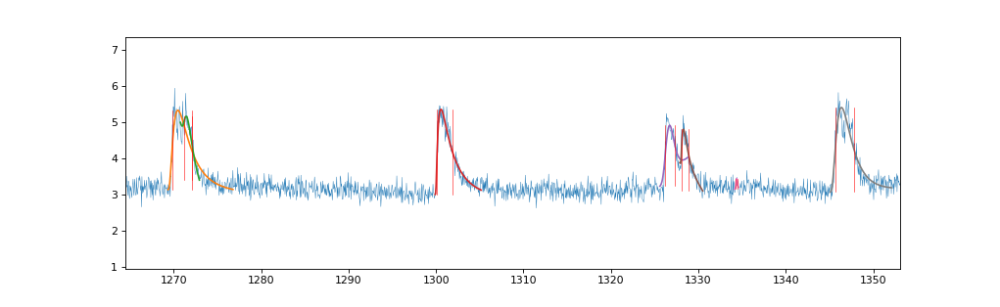

(1264.42747230545, 1353.0718976476137)

In [126]:
plt.figure(figsize=(13,4))
plt.plot(t,origtrace,lw=.4)
for _,fitrow in fittedSpikes.iterrows():
    x = fitrow.yf
    plt.plot(fitrow.time, x,)
    for e in fitrow.edges:
        plt.plot([e]*2,[x.min(),x.max()],"r",lw=.5)
plt.xlim(xl)

In [724]:
fittedSpikes.join(dfts,lsuffix="_fitted",how="outer").fillna(0)

,background,chi2_raw,edges,fshape,halfwidth_fitted,pars,time,ycur,yf,t0_fitted,chi2,height,halfwidth,t0,roi,ts,loghalfwidth,color,score
6206,"[3.500320300354741, 3.5507576881982517, 3.6011...",8.534199e-08,"(1258.9566469089552, 1259.0151515151515)",myLogNorm,0.058505,"(1258.9629882930878, 0.6176554721924693, 1.650...","[1258.888888888889, 1258.939393939394, 1258.98...","[3.5, 3.7265625, 4.171875, 3.703125]","[3.500320300354741, 3.726391761928978, 4.17204...",1258.962988,0.000011,3.049460,0.110031,1258.931354,381,0.5,-0.958486,"[0.2989711013608711, 0.0, 0.0, 1.0]",0.099601
6207,0,0.000000e+00,0,0,0.000000,0,0,0,0,0.000000,0.000000,3.192483,0.071361,1314.766271,381,0.5,-1.146539,"[0.3298556335241757, 0.0, 0.0, 1.0]",0.100901
6208,"[3.428532275858483, 3.474220373557485, 3.51990...",1.087624e-06,"(1319.572645623189, 1319.621212121212)",myLogNorm,0.048566,"(1319.5560569489107, 1.645909046232627, 0.0375...","[1319.5454545454545, 1319.5959595959596, 1319....","[3.4296875, 4.0703125, 3.5625]","[3.428532275858483, 4.069375702956636, 3.56559...",1319.556057,0.000138,3.238174,0.086108,1319.557455,381,0.5,-1.064959,"[0.3504453216330454, 0.0, 0.0, 1.0]",0.101605
6209,"[3.2992215192005196, 3.351150531444861, 3.4030...",2.613230e-04,"(1321.083074516997, 1321.1436784940765)",myLogNorm,0.060604,"(1321.0906945687946, 0.605577811728935, 0.2419...","[1321.010101010101, 1321.060606060606, 1321.11...","[3.3125, 3.4609375, 4.0234375, 3.640625, 3.492...","[3.2992215192005196, 3.460157299085657, 4.0298...",1321.090695,0.033270,3.236496,0.094247,1321.073782,381,0.5,-1.025732,"[0.3504453216330454, 0.0, 0.0, 1.0]",0.101577
6210,0,0.000000e+00,0,0,0.000000,0,0,0,0,0.000000,0.000000,3.453686,0.247794,1326.404159,381,0.5,-0.605908,"[0.4430989181229591, 0.0, 0.0, 1.0]",0.106476
6211,"[4.767641237710381, 4.836872840764327, 4.90610...",1.402003e-03,"(1345.9364436179867, 1345.9914549590244)",myLogNorm,0.055011,"(1345.9415000159406, 0.7493923850110886, 0.052...","[1345.858585858586, 1345.9090909090908, 1345.9...","[4.875, 4.6953125, 5.6484375, 5.1796875, 5.117...","[4.767641237710381, 4.845471468275881, 5.64375...",1345.941500,0.178495,4.097136,0.128012,1345.917676,381,0.5,-0.892750,"[0.7622390838104393, 0.0, 0.0, 1.0]",0.130138


In [102]:
regions.examine_spikesdf(
    fittedSpikes.join(dfts,lsuffix="_fitted",how="outer").fillna(0),
    cols=["halfwidth", "halfwidth_fitted"],
    show_diagonal=True
)

<IPython.core.display.Javascript object>


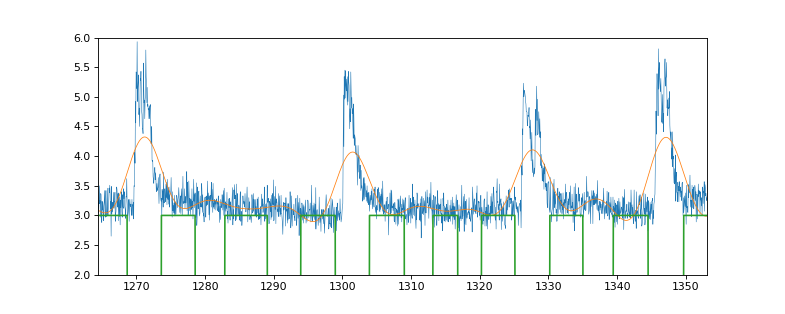

(2.0, 6.0)

In [131]:
plt.figure(figsize=(10,4))
plt.plot(t, origtrace,lw=.5)
xs = tsslows[4]
plt.plot(t, xs,lw=.7)
plt.plot(t[1:-1], (np.diff(np.diff(xs))>0).astype(float)*3,)
plt.xlim(xl)
plt.ylim(2,6)

In [272]:
from scipy.stats import distributions as dst

In [317]:
median_abs_deviation?

In [356]:
tmp = np.array([[median_abs_deviation(z, scale="normal")-1 for z in regions.df['zScore_%g'%ts]] for ts in timescales[:3] if ts<20])

In [334]:
from matplotlib.colors import LogNorm

<IPython.core.display.Javascript object>


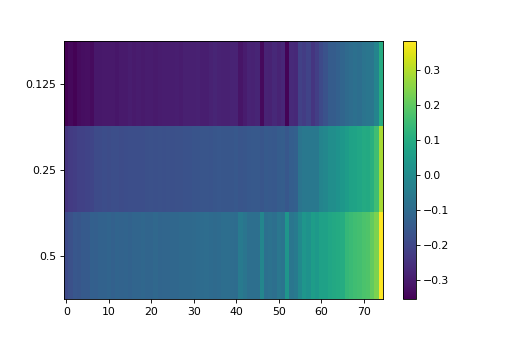

In [357]:
%matplotlib notebook
plt.imshow(tmp[:, np.argsort(tmp[:,:].mean(0))], aspect="auto", #vmax=1, vmin=-1
          )
plt.colorbar()
plt.yticks(np.arange(tmp.shape[0]), timescales[:tmp.shape[0]]);

In [361]:
from islets import crossfilterApp

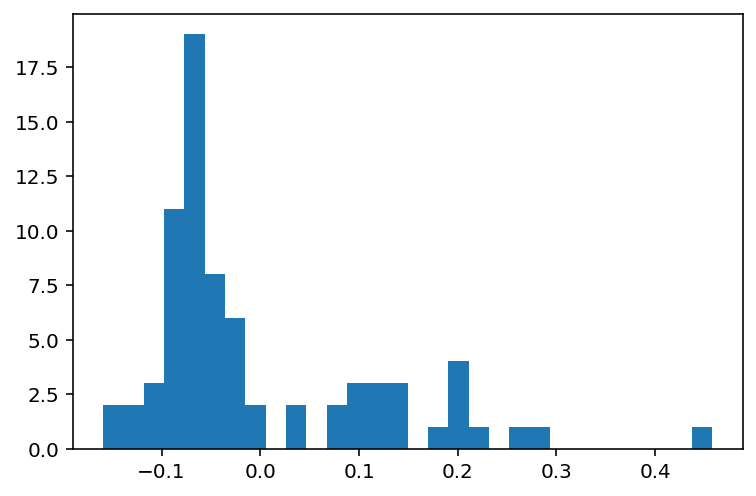

In [300]:
plt.hist(tmp,30);

In [192]:
regions.reset_filtered()
for col in regions.df.columns:
    if "trace_" in col:# and ".5" not in col:
        del regions.df[col]
if hasattr(regions,"spikes"):
    del regions.spikes

In [193]:
tmp = []

############################## timescale = 0.2s, z_threshold = 3
using 'trace' as previous trace.
Nrebin = 1
Nrebin = 1


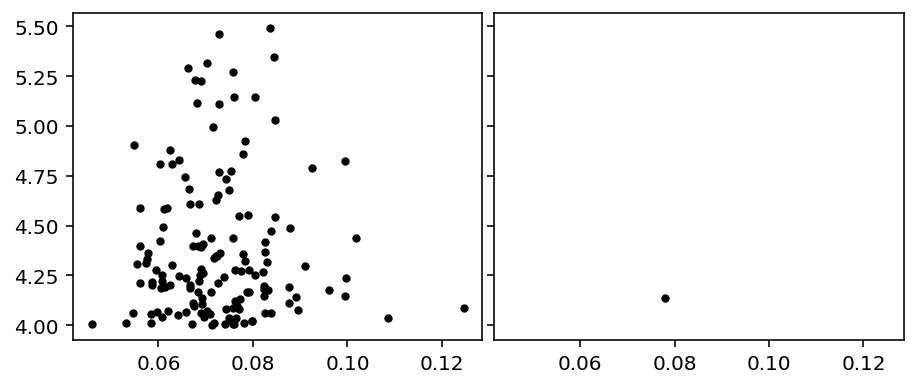

Nrebin = 1
Nrebin = 1


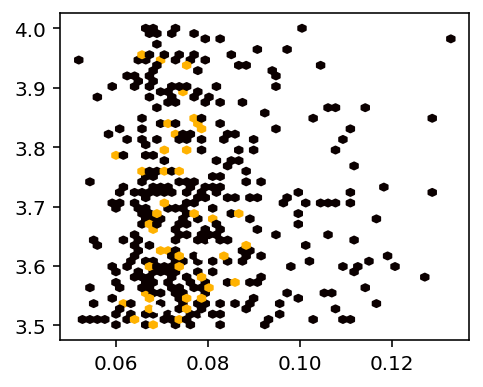

Nrebin = 1
Nrebin = 1


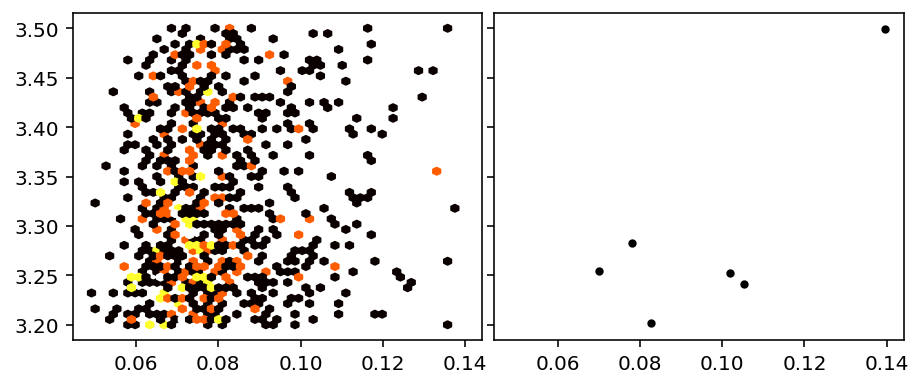

Nrebin = 1
Nrebin = 1
Nrebin = 1


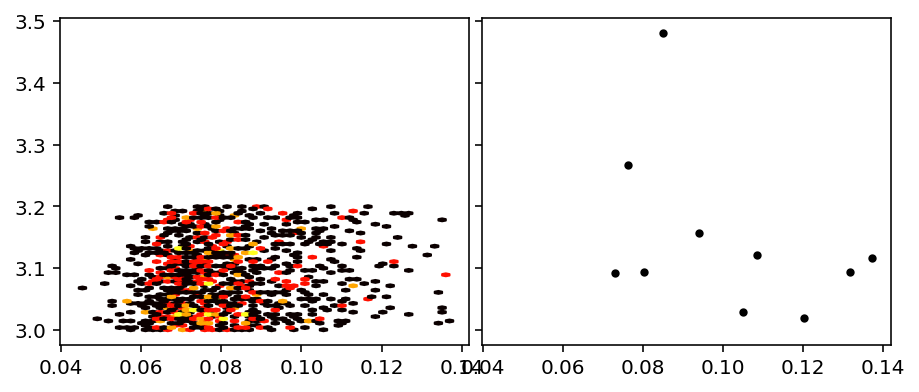

############################## timescale = 0.5s, z_threshold = 3
using 'trace_0.2' as previous trace.
Nrebin = 1
Nrebin = 1


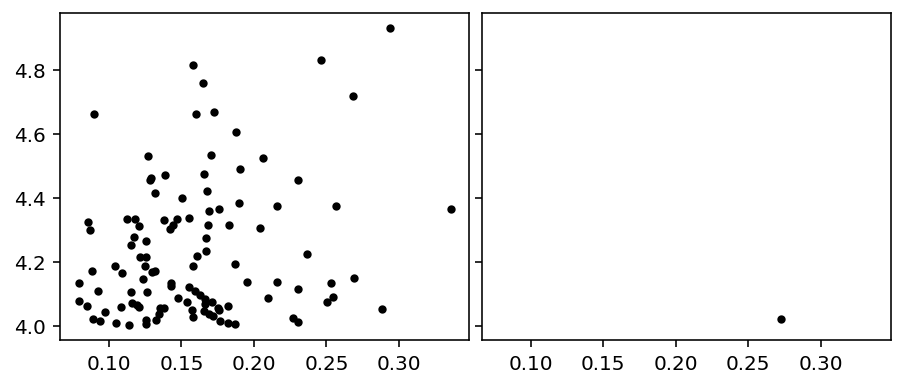

Nrebin = 1
Nrebin = 1
Nrebin = 1


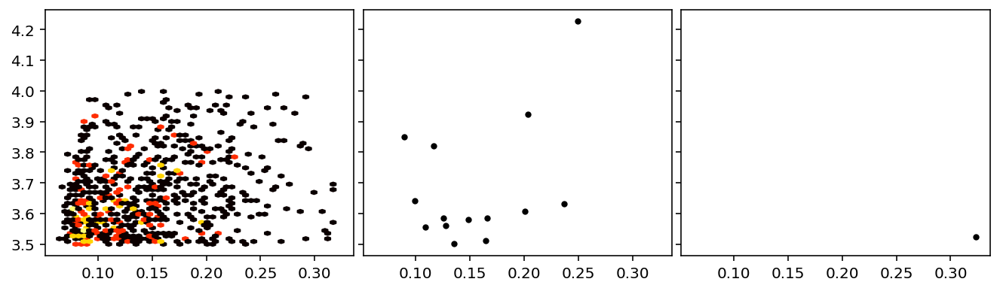

Nrebin = 1
Nrebin = 1
Nrebin = 1


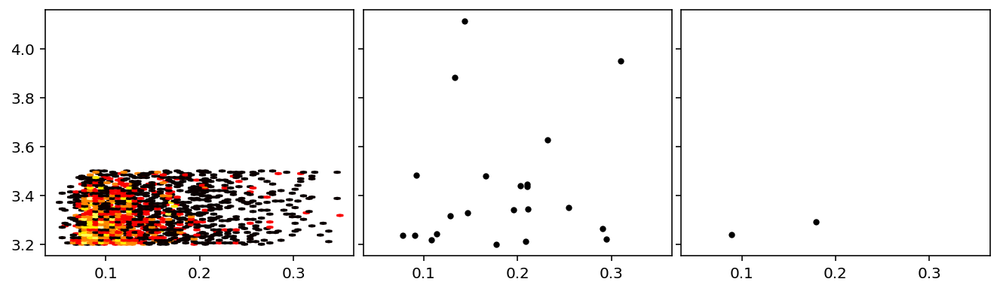

Nrebin = 1
Nrebin = 1
Nrebin = 1


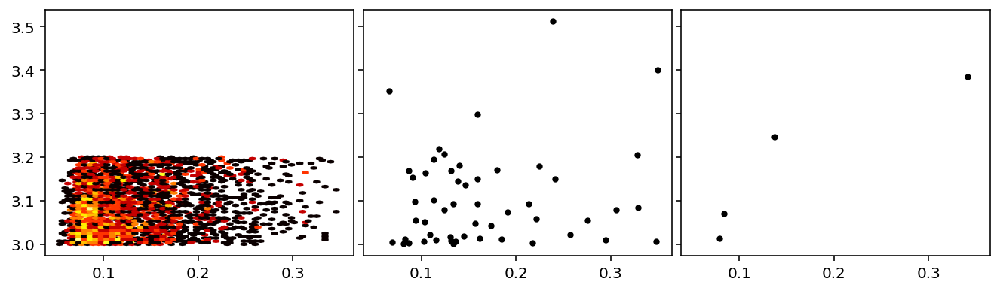

In [194]:
%matplotlib inline
smooth = True
z_sp = 0
for ts in [0.2,0.5,]:
    k = "%g"%ts
    print ("#"*30,f"timescale = {ts}s, z_threshold = {z_th}")
    currcol = "trace_"+k
    
    # infer previous column to base the filtering on.
    candcols = np.array([col for col in regions.df.columns if "trace_" in col])
    candcols_ts = np.array([float(col.split("_")[1]) for col in candcols])
    candcols = candcols[np.argsort(candcols_ts)]
    candcols_ts.sort()
    prevcol = candcols[candcols_ts<ts]
    if len(prevcol): prevcol = prevcol[-1]
    else: prevcol = "trace"
    print (f"using '{prevcol}' as previous trace.")
#     if currcol not in regions.df.columns: 
    regions.df[currcol] = [tr.copy() for tr in regions.df[prevcol]]
    
    for z_th in [4,3.5,3.2,3][:]:
        # set up the plotting figure
        fig, axs = plt.subplots(1,4,figsize=(15,3), sharex=True, sharey=True)
        for ia in range(4):
            ax = axs.flat[ia]
            regions.fast_filter_traces(ts, usecol=currcol, z_sp=z_sp, verbose=True, Npoints=np.inf)
            regions.calc_spikes(ts,z_th=z_th, smooth=smooth, verbose=True)
            spikeDF = regions.spikes[k]
            spikeDF = spikeDF.query(f"halfwidth<{ts*.7}")
            if len(spikeDF)==0:
                ia += -1
                break
            if len(spikeDF)>300:
                ax.hexbin(*spikeDF.iloc[:,[1,0]].values.T, 
                           bins="log",
                           cmap="hot",
                           mincnt=1,
                           gridsize=50
                          )
            else:
                ax.scatter(*spikeDF.iloc[:,[1,0]].values.T, s=10,c="k")
            shave_spikes(spikeDF)
            for ishave in range(1):
                regions.fast_filter_traces(ts, usecol=currcol, z_sp=z_sp, verbose=False, Npoints=np.inf)
                shave_spikes(spikeDF)
                
            for ttmp in tmp:
                spikeDF.index += len(ttmp.index)
            tmp += [spikeDF]
            if len(spikeDF)<10: break

        plt.subplots_adjust(wspace=.03)
        for ia in range(ia+1,axs.size):
            axs.flat[ia].remove()
        plt.show()

In [515]:
regions.examine_spikesdf(
    allSpikes,
#     pd.concat(tmp[:]),#.query(f"roi==494"),
    cols=["halfwidth","height"],
#     show_diagonal=True
#     cols2show=[col for col in regions.df.columns if "trace" in col]
                        )

In [219]:
for col in ["trace_1","trace_2","trace_5","trace_10","trace_20"]:
    if col in regions.df.columns:
        del regions.df[col]

In [220]:
tmp = []

############################## timescale = 5s, z_threshold = 3
using 'trace_2' as previous trace.
Nrebin = 1
dilating by 19
smoothing with kernel 19
Nrebin = 1
dilating by 19
smoothing with kernel 19
Nrebin = 1
dilating by 19
smoothing with kernel 19
Nrebin = 1
dilating by 19
smoothing with kernel 19


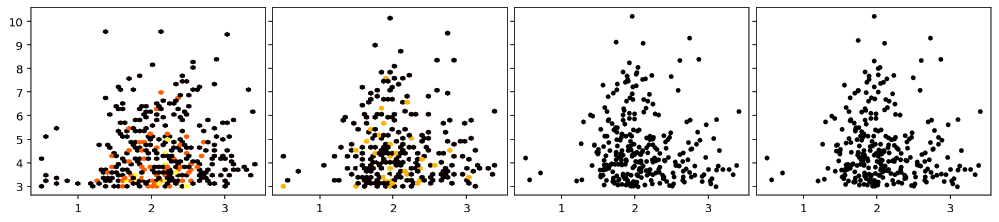

In [224]:
%matplotlib inline
for ts, z_th, z_sp, smooth in [
#     (  .2,4,0,False),
#     (  .2,3.5,0,False),
#     (  .2,3,0,False),
#     (  .5,4,0,False),
#     (  .5,4.5,0,False),
#     (  .5,4,0,False),
#     (  .5,3.5,0,False),
#     (  .5,3,0,False),
#     (  1,3,3,None),
#     (  2,3,3,None),
    (  5,3,3,None),
#     ( 10,3,3,None),
#     ( 20,3,3,None),
#     ( 30,3,3,None),
#     (100,3,3,None),
]:
    k = "%g"%ts
    print ("#"*30,f"timescale = {ts}s, z_threshold = {z_th}")
    currcol = "trace_"+k
    
    # infer previous column to base the filtering on.
    candcols = np.array([col for col in regions.df.columns if "trace_" in col])
    candcols_ts = np.array([float(col.split("_")[1]) for col in candcols])
    candcols = candcols[np.argsort(candcols_ts)]
    candcols_ts.sort()
    prevcol = candcols[candcols_ts<ts]
    if len(prevcol): prevcol = prevcol[-1]
    else: prevcol = "trace"
    print (f"using '{prevcol}' as previous trace.")
    if currcol not in regions.df.columns: 
        regions.df[currcol] = [tr.copy() for tr in regions.df[prevcol]]
    
    # set up the plotting figure
    fig, axs = plt.subplots(1,4,figsize=(15,3), sharex=True, sharey=True)
    for ia in range(4):
        ax = axs.flat[ia]
        regions.fast_filter_traces(ts, usecol=currcol, z_sp=z_sp, verbose=True, Npoints=np.inf)
        regions.calc_spikes(ts,z_th=z_th, smooth=smooth, verbose=True)
        spikeDF = regions.spikes[k]
        if len(spikeDF)==0:
            ia += -1
            break
        if len(spikeDF)>300:
            ax.hexbin(*spikeDF.iloc[:,[1,0]].values.T, 
                       bins="log",
                       cmap="hot",
                       mincnt=1,
                       gridsize=50
                      )
        else:
            ax.scatter(*spikeDF.iloc[:,[1,0]].values.T, s=10,c="k")
        fittedSpikes = multi_map(subf_, [a for _,a in spikeDF.iterrows()], processes=10)
        fittedSpikes = pd.concat(fittedSpikes)
        if len(fittedSpikes):
            fittedSpikes = fittedSpikes.query(f"halfwidth<{ts/2}")
            candHW = spikeDF.loc[fittedSpikes.index, "halfwidth"]
            candT0 = spikeDF.loc[fittedSpikes.index, "t0"]
            fittedSpikes = fittedSpikes[np.abs(fittedSpikes.t0-candT0)/fittedSpikes.halfwidth<3]
            fittedSpikes = fittedSpikes[np.abs((fittedSpikes.halfwidth-candHW)/np.min([fittedSpikes.halfwidth,candHW],0))<1]
            shave_fitted(fittedSpikes)
            merged = fittedSpikes.join(spikeDF,lsuffix="_fitted",how="outer")
        else:
            merged = spikeDF.copy()
        for ttmp in tmp:
            merged.index += len(ttmp.index)
        tmp += [merged]
        if len(spikeDF)<10 or len(fittedSpikes)==0: break
            
    plt.subplots_adjust(wspace=.03)
    for ia in range(ia+1,axs.size):
        axs.flat[ia].remove()
    plt.show()
    
#     tr = np.vstack([ regions.df.loc[ix,prevcol]*regions.df.loc[ix,"size"] for ix in regions.df.index])
#     s  = np.vstack([ regions.df.loc[ix,"slower_%g"%ts]*regions.df.loc[ix,"size"] for ix in regions.df.index])
#     nRebin = int(regions.df[prevcol].iloc[0].shape[0]/s.shape[1])
#     if nRebin>1:
#         tr = islets.numeric.rebin(tr,nRebin,1, func=np.sum)
#     z = (tr-s)/(s*regions.gain)**.5
#     regions.calc_spikes(ts,z_th=z_th, zScores=z, verbose=True, smooth=smooth)
#     spikeDF = regions.spikes[k]
#     if len(spikeDF):
#         plt.hexbin(*spikeDF.iloc[:,[1,0]].values.T, 
#                    bins="log",
#                    cmap="hot",
#                    mincnt=1,
#                    gridsize=50,
#                    # yscale="log"
#                   )
#         spikeDF = spikeDF.query(f"halfwidth>{2/regions.Freq}")

In [225]:
regions.examine_spikesdf(
    pd.concat(tmp[-1:]).fillna(0.03),
#     merged.fillna(.03),
    cols=["halfwidth","halfwidth_fitted"],
    show_diagonal=True,
#     cols2show=[col for col in regions.df.columns if "trace" in col]
                        )

In [226]:
roi = 385
t0 = 1555
# subm = pd.concat(tmp[-3:]).query(f'roi=={roi}')
subm = spikeDF.query(f'roi=={roi}')
interestingRow = subm.loc[(subm["t0"]-t0).abs().idxmin()]
interestingRow

height          4.588870
halfwidth       2.771550
t0           1555.509981
roi           385.000000
Name: 154, dtype: float64

fshape                                                myLogNorm
pars          (1555.9327361270675, 1.4482844892548778, 2.886...
score                                                   53.0875
background                                              7.28051
halfwidth                                               2.73993
amplitude                                               1.44464
t0                                                      1555.93
Name: 154, dtype: object

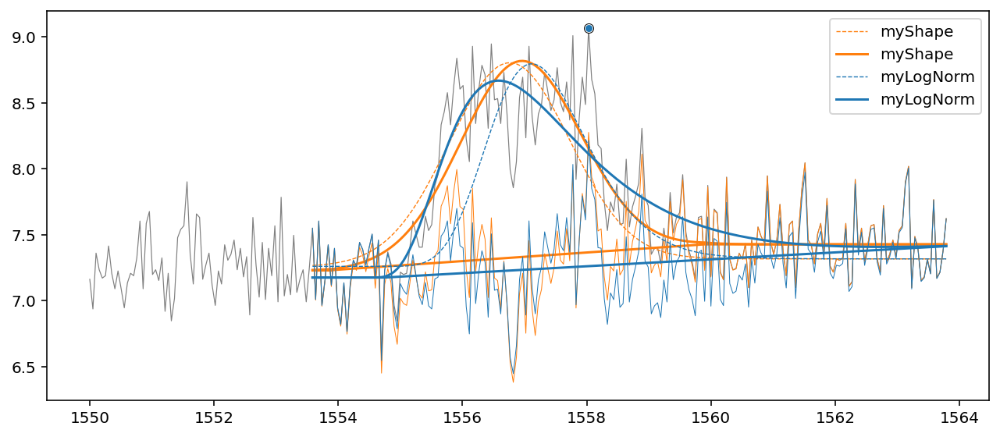

In [227]:
i0 = np.searchsorted(t, interestingRow["t0"]-2*interestingRow.halfwidth)
ie = np.searchsorted(t, interestingRow["t0"]+3*interestingRow.halfwidth)
tt = t[i0:ie]

introwfit = islets.fit_spikes(
    tt,
    regions.df.loc[roi,"trace"][i0:ie],
    pd.DataFrame([interestingRow]),
    regions.df.loc[roi,"slower_%g"%ts][i0:ie],
    plot=True,
    verbose=True,
#     rel_amplitude_threshold=1e-10,
#     halfwidth_threshold=None
)
introwfit = introwfit.iloc[0]
introwfit

In [228]:
subf_(interestingRow)

,fshape,pars,score,background,halfwidth,amplitude,t0,roi
154,myLogNorm,"(1555.9327361270675, 1.4482844892548778, 2.886...",53.087517,7.280506,2.739934,1.444635,1555.932736,385


In [128]:
tt = np.linspace(t[i0], t[ie],1000)

In [129]:
introwfit.fshape

'myLogNorm'

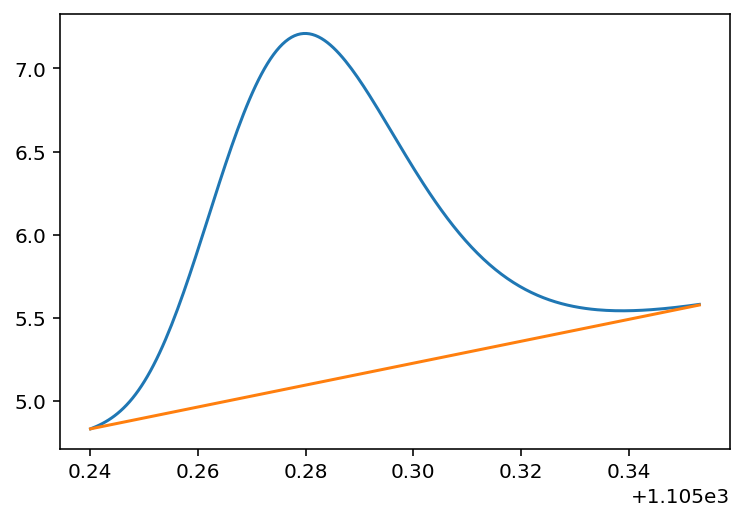

In [130]:
xf, bg = generic_function(introwfit.fshape, introwfit.pars, tt, bkgsum=False, fillnan=True)
plt.plot(tt, xf+bg)
plt.plot(tt, bg)
# plt.xlim(t0-.1, t0+.2)

In [ ]:
islets.fit_spikes

In [104]:
# regions.examine_spikesdf(fittedSpikes.rename(columns={"loc":"t0"}).fillna(0),
#                          cols=["halfwidth","snr"], 
#                          debug=False,
#                          fitDF=fittedSpikes,
#                          cols2show = [col for col in regions.df.columns if "trace" in col]
#                         )

In [108]:
allSpikes = pd.concat(tmp, ignore_index=True)
del allSpikes['err']

In [106]:
# pd.plotting.scatter_matrix(allSpikes[['score', 'background', 'halfwidth_fitted',
#        'amplitude', 'snr', 'height', 'halfwidth',]].fillna(0), figsize=(12,10));

In [121]:
bla = tmp[-3].copy()
# del bla['err']
# bla = bla.dropna()
# bla = allSpikes[allSpikes.isna().any(1)]
regions.examine_spikesdf(bla,
                         cols=["halfwidth", "halfwidth_fitted"], 
                         debug=False,
                         show_diagonal=True,
                         fitDF=bla,
                         cols2show = [col for col in regions.df.columns if "trace" in col],
                        )

In [75]:
# bla = allSpikes.dropna()
bla = allSpikes[allSpikes.isna().any(1)]
regions.examine_spikesdf(bla,
                         cols=["halfwidth", "height"], 
                         debug=False,
#                          show_diagonal=True,
                         fitDF=bla,
                        )

In [50]:
from scipy.spatial import distance_matrix

In [56]:
dists = distance_matrix(allSpikes.query(f"roi=={roi}")["loc"].values.reshape(-1,1),allSpikes.query(f"roi=={roi}")["loc"].values.reshape(-1,1))

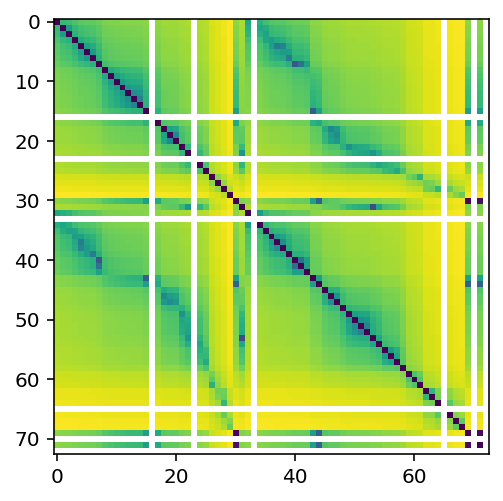

In [59]:
plt.imshow(np.log(dists+.01))

In [65]:
from scipy import signal

In [71]:
signal.peak_widths(xf, signal.find_peaks(xf)[0])

(array([4.75926458]),
 array([1.02179037]),
 array([6.99692033]),
 array([11.75618491]))

In [72]:
4.75/regions.Freq

0.2398989898989899

In [73]:
interestingRow.halfwidth_fitted

0.10718219065525318

""


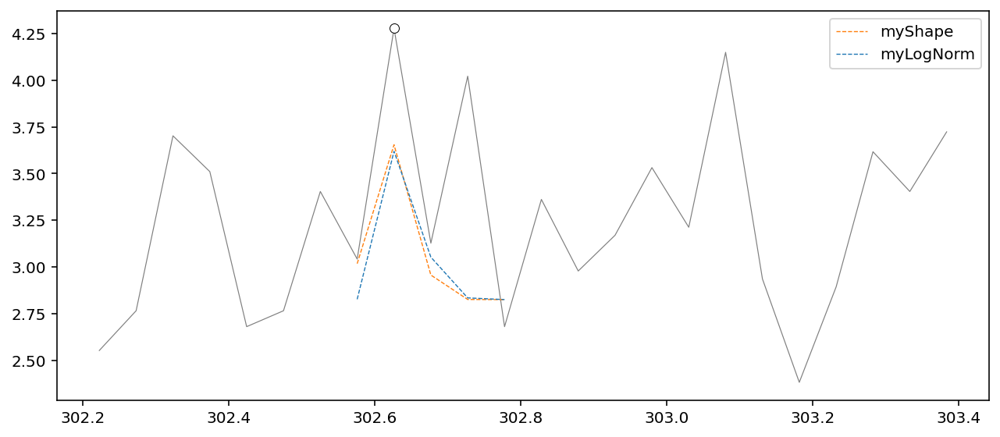

In [78]:
islets.fit_spikes(t[i0:ie], regions.df.loc[interestingRow.roi,"trace"][i0:ie], pd.DataFrame([interestingRow]), plot=True)

In [79]:
pd.DataFrame([interestingRow])

,fshape,pars,score,background,halfwidth_fitted,amplitude,loc,roi_fitted,err,snr,height,halfwidth,t0,roi
177,myShape,"(302.5948462392513, 2.079149911059008, 5050.46...",3.559331,1.799719,0.107182,2.04355,302.594846,494.0,None,15.01829,5.401796,0.079367,302.58741,494


In [58]:
t0

5992

In [ ]:
regions.examine_spikesdf(\
#                          fittedSpikes,
                         merged,
                         cols=["halfwidth","halfwidth_fitted"], 
#                          spikeDF,cols=["halfwidth","height"], 
#                          cols=["halfwidth","halfwidth_fitted"], 
                         debug=False,
#                          cols2show=["trace","slower_0.5","slower_1","trace_0.5"],
                         fitDF=fittedSpikes,
                         show_diagonal=True,
                        )

In [496]:
merged[merged.halfwidth_fitted==0]

,fshape,pars,score,background,halfwidth_fitted,amplitude,loc,height,halfwidth,t0,roi
11,NaN,NaN,NaN,NaN,0.0,NaN,NaN,5.007914,0.088938,681.977043,77
35,NaN,NaN,NaN,NaN,0.0,NaN,NaN,5.405853,0.089065,1226.423244,192
51,NaN,NaN,NaN,NaN,0.0,NaN,NaN,5.095345,0.158444,1077.202147,205
52,NaN,NaN,NaN,NaN,0.0,NaN,NaN,5.350690,0.101596,1150.515636,205
71,NaN,NaN,NaN,NaN,0.0,NaN,NaN,5.662754,0.142112,2655.900926,205
174,NaN,NaN,NaN,NaN,0.0,NaN,NaN,5.561588,0.158752,260.491413,494
184,NaN,NaN,NaN,NaN,0.0,NaN,NaN,5.018883,0.089672,534.054211,494


In [486]:
del regions.hb.df["bin_id"]

fig = regions.hb._hexbin(gridsize=100,return_figure=True,)
# fig.update_layout({"margin":dict(l=10, r=10, t=20, b=40)})
fig

In [475]:
regions.hb.df.iloc[:,:2].values#.nanmin()

array([[       nan, 0.05050506],
       [       nan, 0.05076018],
       [0.10812627, 0.05304248],
       [0.10392917, 0.05753157],
       [       nan, 0.05050505],
       [       nan, 0.05075928],
       [       nan, 0.05865724],
       [       nan, 0.05050505],
       [0.1496559 , 0.10792231],
       [       nan, 0.05050581],
       [       nan, 0.05050505],
       [       nan, 0.05457007],
       [0.11014334, 0.05708715],
       [0.11429278, 0.07366749],
       [       nan, 0.05050505],
       [       nan, 0.05050505],
       [       nan, 0.05050505],
       [0.24118819, 0.06794946],
       [       nan, 0.05050505],
       [       nan, 0.05050505],
       [       nan, 0.05050505],
       [       nan, 0.05076819],
       [       nan, 0.05009521],
       [       nan, 0.05050505],
       [       nan, 0.05050505],
       [       nan, 0.05210417],
       [       nan, 0.0670384 ],
       [       nan, 0.05050505],
       [       nan, 0.05050505],
       [       nan, 0.05050505],
       [  

In [471]:
fig.layout["xaxis"]

layout.XAxis({
    'title': {'text': 'halfwidth'}
})

In [328]:
# regions.examine_spikesdf(spikeDF,cols=["halfwidth","height"],
#                          debug=False,
# #                          cols2show=["trace","slower_0.3"],
#                         )

In [329]:
tmp = pd.concat(tmp,ignore_index=True)
tmp.shape

(2128, 4)

In [330]:
spikeDF.shape

(2128, 4)

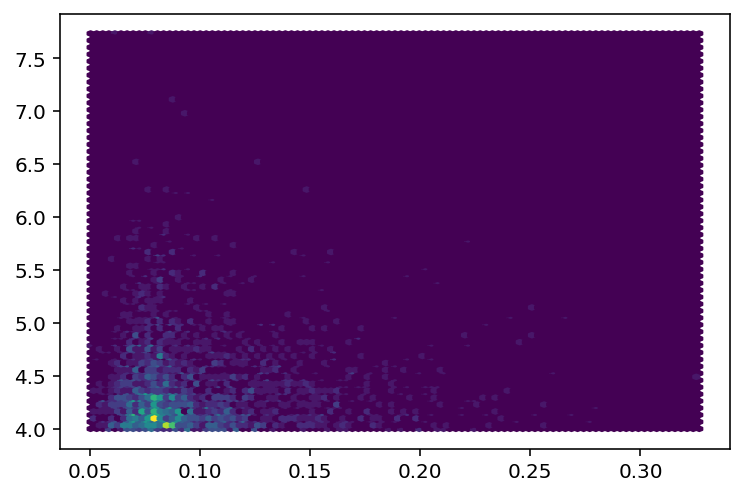

In [331]:
plt.hexbin(spikeDF.halfwidth, spikeDF.height)

In [350]:
fittedSpikes = multi_map(subf, spikeDF.query(f"halfwidth>={2/regions.Freq}").groupby("roi"), processes=10)

/home/srdjan/github/Physio_Ca/islets/fitting.py:116: RuntimeWarning:

Mean of empty slice.

/opt/tljh/user/envs/physio_dev/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning:

invalid value encountered in double_scalars

/home/srdjan/github/Physio_Ca/islets/fitting.py:209: RuntimeWarning:

Mean of empty slice

/home/srdjan/github/Physio_Ca/islets/fitting.py:212: RuntimeWarning:

All-NaN slice encountered

/home/srdjan/github/Physio_Ca/islets/fitting.py:125: RuntimeWarning:

Mean of empty slice.



In [351]:
fittedSpikes = pd.concat(fittedSpikes)

In [337]:
# fittedSpikes.join(spikeDF,rsuffix="_cand",how="outer").iloc[:40]

In [341]:
# frow = fittedSpikes.iloc[0]

In [342]:
# merged.iloc[0]

In [343]:
# tmp = islets.fit_spikes(t, regions.df.loc[8,"trace"], spikeDF.loc[:1],ifit=1, plot=True)
# plt.xlim(frow["loc"]-3,frow["loc"]+3)


# tt =  np.linspace(-1,10,1000)+frow["loc"]
# x_fit, bkg = generic_function(frow.fshape, frow.pars,tt, fillnan=False,bkgsum=False)

# # plt.plot()
# plt.plot(tt, bkg+x_fit,'k.', ms=2)
# plt.plot(tt, bkg,'k.', ms=2)
# plt.plot(tt, x_fit,'k.', ms=2)

(558.0, 560.0)

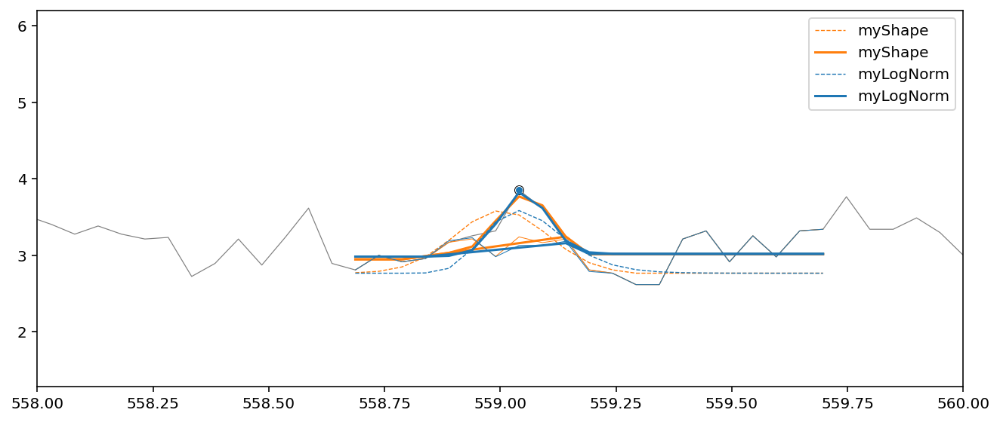

In [373]:
ix = 494
t0 = 559
cand = spikeDF.query(f"roi=={ix}").copy()
cand = cand.loc[[np.abs(cand.t0-t0).idxmin()]]
tmp = islets.fit_spikes(t, regions.df.loc[ix,'trace'], cand, plot=True)
plt.xlim(t0-1, t0+1)

In [372]:
tmp

,fshape,pars,score,background,halfwidth,amplitude,loc
689,myLogNorm,"(559.0145261829778, 0.83489752989626, 4.289562...",9.23501,3.030972,0.050557,0.722621,559.014526


#### Old

In [258]:
regions.reset_filtered()
for col in regions.df.columns:
    if "trace_" in col:
        del regions.df[col]
if hasattr(regions,"spikes"):
    del regions.spikes

In [230]:
###### hide
# for ts, z_th, z_sp, smooth in [
#     (.3,5,0,False),
#     (1,4,0,False),
# #     (3,3,3,True),
# #     (10,3,3,True),
# ]:

#     k = "%g"%ts
#     currcol = "trace_"+k
#     prevcol = "trace_"+"%.1g"%(ts/3)
#     if prevcol not in regions.df.columns:
#         prevcol = "trace"
#     regions.df[currcol] = [tr.copy() for tr in regions.df[prevcol]]

#     fig, axs = plt.subplots(1,4,figsize=(15,3), sharex=True, sharey=True)
#     for ia in range(3):
#         ax = axs.flat[ia]
#         s,f,z = regions.fast_filter_traces(ts, usecol=currcol, write=False, normalize=False, z_sp=z_sp)
#         regions.calc_spikes(ts,z_th=z_th, zScores=z, smooth=smooth)
#         t = regions.showTime.get(k, regions.time)
#         spikeDF = regions.spikes[k]
#         spikeDF = spikeDF.query(f"halfwidth<{ts/2}")
#         ax.hexbin(*spikeDF.iloc[:,[1,0]].values.T, 
#         #            bins="log",
#                    cmap="hot",
#                    mincnt=1,
#                    gridsize=50
#                   )
#         for _, spike in spikeDF.iterrows():
#             i0 = np.searchsorted(t, spike.t0)-1
#             ie = np.searchsorted(t, spike.t0+spike.halfwidth*1.05)
#             x = regions.df.loc[spike.roi,currcol]
#             corr = np.interp(t[i0:ie], [t[i0],t[ie]], [x[i0],x[ie]])
#             x[i0:ie] = corr
#     plt.subplots_adjust(wspace=.03)
#     plt.show()
    
#     tr = np.vstack([ regions.df.loc[ix,prevcol]*regions.df.loc[ix,"size"] for ix in regions.df.index])
#     nRebin = int(regions.df[prevcol].iloc[0].shape[0]/s.shape[1])
#     if nRebin>1:
#         tr = islets.numeric.rebin(tr,nRebin,1, func=np.sum)
#     z = (tr-s)/(s*regions.gain+5e-1)**.5
#     regions.calc_spikes(ts,z_th=z_th, zScores=z, verbose=True, smooth=smooth)
#     spikeDF = regions.spikes[k]

#     plt.hexbin(*spikeDF.iloc[:,[1,0]].values.T, 
#                bins="log",
#                cmap="hot",
#                mincnt=1,
#                gridsize=50,
#                # yscale="log"
#               )


In [231]:
# regions0 = deepcopy(regions)

In [232]:
regions.Freq

19.8

In [233]:
regions.showTime.keys()

dict_keys([])

In [234]:
regions.showTime = {}

In [355]:
merged.shape

(731, 11)

In [235]:
# regions.df.trace = list(np.maximum(0, np.random.normal(loc=s[:,:1000], scale=s[:,:1000]**.5*1.001)))
# regions.df.trace = [tr/size for tr, size in zip(regions.df.trace, regions.df["size"])]
# regions.infer_gain(plot=True)

In [357]:
t.shape

(53459,)

,height,halfwidth,t0,roi
689,4.049639,0.285971,558.873643,494


############################## timescale = 0.5s
using 'trace' as previous trace.
Nrebin = 1


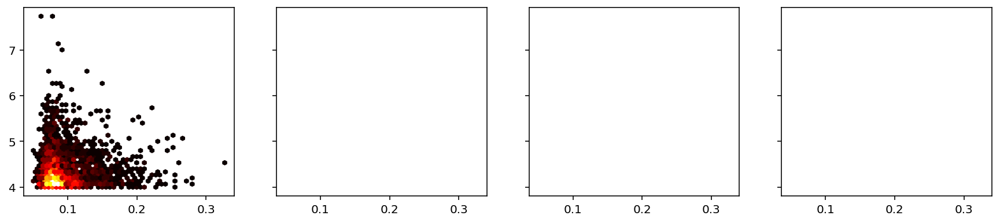

In [327]:
%matplotlib inline

for ts, z_th, z_sp, smooth in [
    (  .5,4,0,False),
#     (  1,3,3,None),
#     (  3,3,3,None),
#     ( 10,3,3,None),
#     ( 30,3,3,None),
#     (100,3,3,None),
]:
    k = "%g"%ts
    print ("#"*30,f"timescale = {ts}s")
    
    currcol = "trace_"+k
    candcols = np.array([col for col in regions.df.columns if "slower" in col])
    candcols_ts = np.array([float(col.split("_")[1]) for col in candcols])
    candcols = candcols[np.argsort(candcols_ts)]
    candcols_ts.sort()
    prevcol = candcols[candcols_ts<ts]

    if len(prevcol):
        prevcol = prevcol[-1]
    else:
        prevcol = "trace"
    print (f"using '{prevcol}' as previous trace.")
    regions.df[currcol] = [tr.copy() for tr in regions.df[prevcol]]
    tmp = []
    fig, axs = plt.subplots(1,4,figsize=(15,3), sharex=True, sharey=True)
    for ia in range(4):
        ax = axs.flat[ia]
        regions.fast_filter_traces(ts, usecol=currcol, z_sp=z_sp, verbose=True, Npoints=np.inf)
        regions.calc_spikes(ts,z_th=z_th, smooth=smooth, verbose=True)
        spikeDF = regions.spikes[k]
        tmp += [spikeDF.copy()]
#         if len(spikeDF<1):
#             ia += -1
#             break
        ax.hexbin(*spikeDF.iloc[:,[1,0]].values.T, 
        #            bins="log",
                   cmap="hot",
                   mincnt=1,
                   gridsize=50
                  )
#         spikeDF = spikeDF.query(f"halfwidth>{2/regions.Freq}")
        break
#         for _, spike in spikeDF.iterrows():
# #             if spike.halfwidth<2/regions.Freq: continue
#             i0 = np.searchsorted(t, spike.t0)-1
#             ie = np.searchsorted(t, spike.t0+spike.halfwidth*1.05)
#             x = regions.df.loc[spike.roi,currcol]
#             xs = regions.df.loc[spike.roi,currcol.replace("trace","slower")]
#             corr = np.interp(t[i0:ie], [t[i0],t[ie]], [xs[i0],xs[ie]])
#             x[i0:ie] = corr
#         if len(spikeDF)<10: break
#     plt.subplots_adjust(wspace=.03)
#     for ia in range(ia+1,axs.size):
#         axs.flat[ia].remove()
#     plt.show()
    
#     tr = np.vstack([ regions.df.loc[ix,prevcol]*regions.df.loc[ix,"size"] for ix in regions.df.index])
#     s  = np.vstack([ regions.df.loc[ix,"slower_%g"%ts]*regions.df.loc[ix,"size"] for ix in regions.df.index])
#     nRebin = int(regions.df[prevcol].iloc[0].shape[0]/s.shape[1])
#     if nRebin>1:
#         tr = islets.numeric.rebin(tr,nRebin,1, func=np.sum)
#     z = (tr-s)/(s*regions.gain)**.5
#     regions.calc_spikes(ts,z_th=z_th, zScores=z, verbose=True, smooth=smooth)
#     spikeDF = regions.spikes[k]
#     if len(spikeDF):
#         plt.hexbin(*spikeDF.iloc[:,[1,0]].values.T, 
#                    bins="log",
#                    cmap="hot",
#                    mincnt=1,
#                    gridsize=50,
#                    # yscale="log"
#                   )
#         spikeDF = spikeDF.query(f"halfwidth>{2/regions.Freq}")

In [328]:
# regions.examine_spikesdf(spikeDF,cols=["halfwidth","height"],
#                          debug=False,
# #                          cols2show=["trace","slower_0.3"],
#                         )

In [329]:
tmp = pd.concat(tmp,ignore_index=True)
tmp.shape

(2128, 4)

In [330]:
spikeDF.shape

(2128, 4)

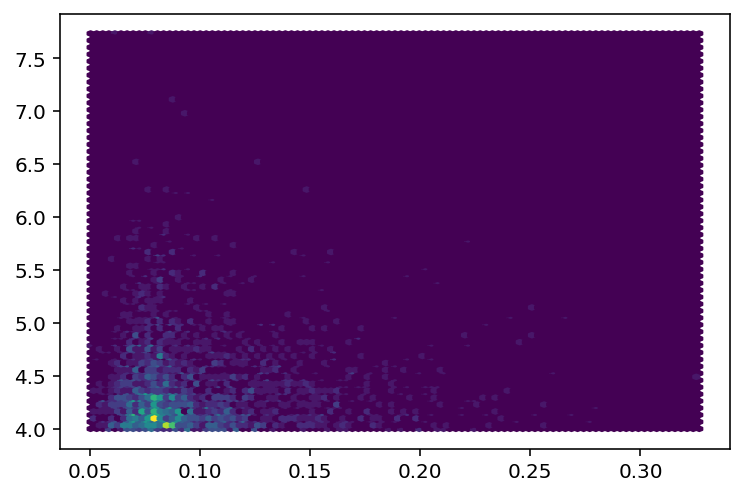

In [331]:
plt.hexbin(spikeDF.halfwidth, spikeDF.height)

In [332]:
from islets.utils import multi_map

In [334]:
def subf(ixdf):
    ix, df = ixdf
    out = islets.fit_spikes(t,regions.df.loc[ix,"trace"],df, ifit=5)
    if "pars" in out.columns:
        out.pars = out.pars.apply(tuple)
    return out

In [335]:
fittedSpikes = multi_map(subf, spikeDF.groupby("roi"), processes=10)

In [336]:
fittedSpikes = pd.concat(fittedSpikes)

In [337]:
# fittedSpikes.join(spikeDF,rsuffix="_cand",how="outer").iloc[:40]

In [338]:
merged = fittedSpikes.join(spikeDF,lsuffix="_fitted",how="outer")

In [339]:
merged.loc[merged.halfwidth_fitted.isna(),"halfwidth_fitted"] = 0

In [341]:
# frow = fittedSpikes.iloc[0]

In [342]:
# merged.iloc[0]

In [343]:
# tmp = islets.fit_spikes(t, regions.df.loc[8,"trace"], spikeDF.loc[:1],ifit=1, plot=True)
# plt.xlim(frow["loc"]-3,frow["loc"]+3)


# tt =  np.linspace(-1,10,1000)+frow["loc"]
# x_fit, bkg = generic_function(frow.fshape, frow.pars,tt, fillnan=False,bkgsum=False)

# # plt.plot()
# plt.plot(tt, bkg+x_fit,'k.', ms=2)
# plt.plot(tt, bkg,'k.', ms=2)
# plt.plot(tt, x_fit,'k.', ms=2)

In [344]:
regions.examine_spikesdf(\
#                          fittedSpikes,
                         merged,
                         cols=["halfwidth","halfwidth_fitted"], 
#                          spikeDF,cols=["halfwidth","height"], 
#                          cols=["halfwidth","halfwidth_fitted"], 
                         debug=False,
#                          cols2show=["trace","slower_0.5","slower_1","trace_0.5"],
                         fitDF=fittedSpikes
                        )

In [276]:
regions.hb.df.query("bin_id==238")

,halfwidth,halfwidth_fitted,bin_id
424,0.495521,1.081,238


In [63]:
spikeDF.loc[98]

height         6.443151
halfwidth      0.203689
t0             1.936185
roi          358.000000
Name: 98, dtype: float64

<AxesSubplot:xlabel='halfwidth', ylabel='halfwidth_fitted'>

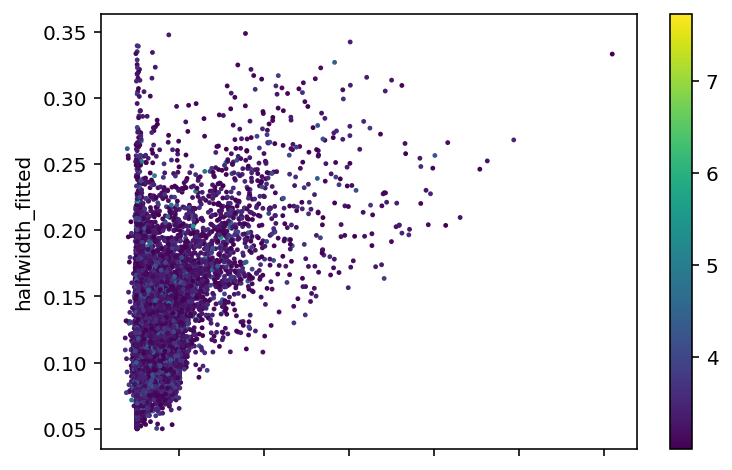

In [67]:
comb.plot.scatter(y="halfwidth_fitted",x="halfwidth",color=comb["height"], cmap="viridis", s=2)

In [56]:
comb.columns

Index(['fshape', 'pars', 'score', 'background', 'halfwidth', 'amplitude',
       'loc', 'norm_amplitude', 'roi', 'height', 'halfwidth_fitted', 't0',
       'roi_fitted'],
      dtype='object')

In [57]:
spikeDF.columns

Index(['height', 'halfwidth', 't0', 'roi'], dtype='object')

In [60]:
(comb.roi == comb.roi_fitted).all()

True

In [61]:
del comb["roi_fitted"]

In [ ]:
fitted_columns = ['fshape', 'pars', 'score', 'background', 'amplitude','loc', 'norm_amplitude', 'roi', 'halfwidth_fitted',]

In [295]:
ix = 316
yraw = regions.df.loc[ix,"trace"]
y = yraw#islets.numeric.runningAverage(yraw,3)
candidates = spikeDF.query(f"roi=={ix}")

In [298]:
# %matplotlib notebook

t = regions.time
n = len(t)
spFitted = islets.fit_spikes(t[:n],y[:n],candidates,
#                   plot=True,
                 )
# plt.plot(t[:n], yraw[:n], lw=.3)

In [299]:
spFitted["norm_amplitude"] = spFitted["amplitude"]/(spFitted["background"]*spFitted["halfwidth"]*regions.gain)**.5

In [300]:
# plt.figure()
# fr,pw = islets.numeric.power_spectrum(yraw[i0:ie],regions.Freq)
# plt.plot(fr[fr>.1],pw[fr>.1],"^-")

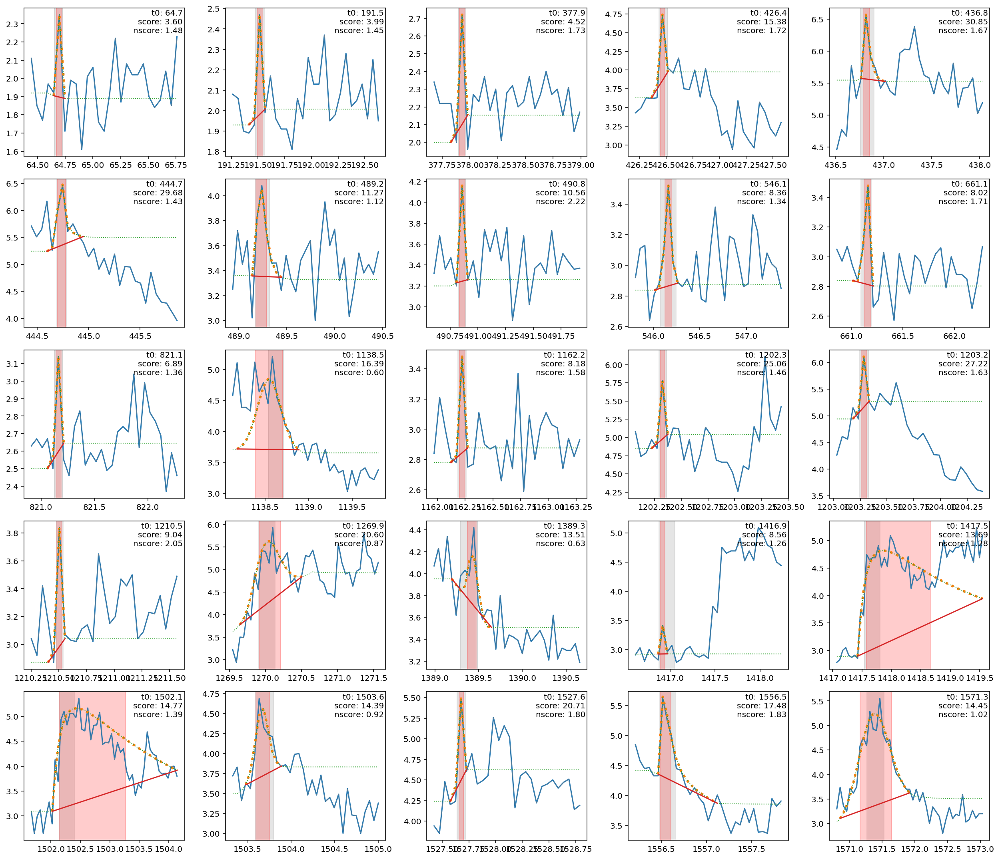

In [301]:
nc = 5
nr = int(np.ceil(len(candidates)/nc))
nr = min(nr,5)
fig, axs = plt.subplots(nr,nc,figsize=(nc*3.5,nr*3))

for ix, ax in zip(spFitted.index[:], axs.flat):
    fitrow = spFitted.loc[ix]
    candrow = candidates.loc[ix]
    t0 = min(fitrow["loc"], candrow["t0"])
    hw = max(fitrow["halfwidth"], candrow["halfwidth"])
    i0 = np.searchsorted(t, t0-.5*hw-.2)
    ie = np.searchsorted(t, t0+2*hw+1)
    ax.plot(t[i0:ie], y[i0:ie])
    ax.plot(t[i0:ie], yraw[i0:ie],color="grey", lw=.3)
    yl = ax.get_ylim()
    ax.fill_between([candrow["t0"],candrow["t0"]+candrow["halfwidth"]], [y[i0:ie].max()*2]*2, color="grey", alpha = .2)
#     ax.fill_between([fitrow["loc"],fitrow["loc"]+fitrow["halfwidth"]], [y[i0:ie].max()*2]*2, color="red", alpha = .2)
#     x_fit = islets.fitting.multiShape(t[i0:ie],spFitted.loc[[ix]], bkgsum=True, fillnan=True)
    x_fit, bkg = islets.fitting.__dict__[fitrow.fshape](t[i0:ie], *fitrow.pars, fillnan=False, bkgsum=False)
    xx = np.ones_like(x_fit)*np.nan
    ifit0, ifit_end = np.where(np.abs(np.diff(x_fit))>x_fit.std()/10)[0][[0,-1]]
    x_fit += bkg
    ifit_end += 2
    xx[ifit0:ifit_end] = x_fit[ifit0:ifit_end]
    _, w, ll, rl = np.squeeze(peak_widths(xx,find_peaks(xx)[0]))*(t[1]-t[0])
    ax.plot(t[i0:ie],xx,ls="dotted",lw=3)
    ax.plot(t[i0:ie],x_fit,ls="dotted",lw=1)
    ax.plot(t[i0:ie][[ifit0,ifit_end-1]],x_fit[[ifit0,ifit_end-1]])
    ax.fill_between([ll+t[i0],rl+t[i0]], [y[i0:ie].max()*2]*2, color="red", alpha = .2)
    ax.set_ylim(yl)
    ax.text(.99,.99, "t0: %.1f\nscore: %.2f\nnscore: %.2f"%(candrow.t0, fitrow.score, fitrow.norm_amplitude), va="top", transform=ax.transAxes, ha="right")
# for ax in axs.flat:
#     ax.set_yticks([])
#     ax.set_xticks([])
    
plt.tight_layout()

In [285]:
y.shape

(53459,)

In [286]:
t.shape

(53459,)

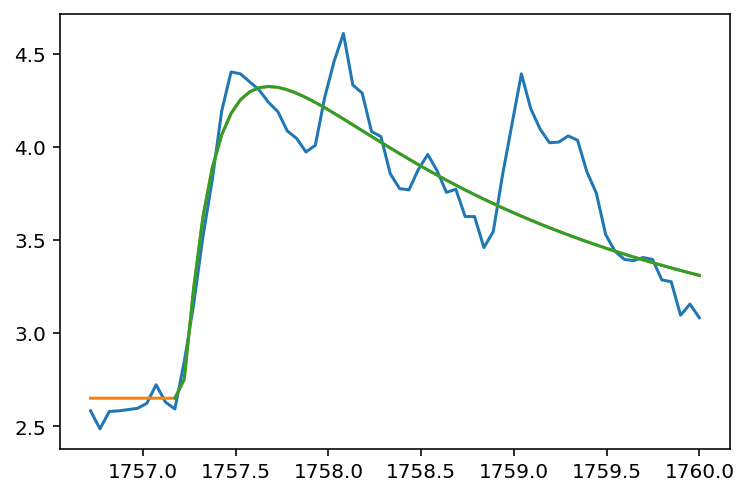

In [287]:
plt.plot(t[i0:ie],y[i0:ie])
plt.plot(t[i0:ie],x_fit)
plt.plot(t[i0:ie],xx)

In [184]:
from scipy.signal import find_peaks, peak_widths

In [290]:
spFitted

,fshape,pars,score,background,halfwidth,amplitude,loc,norm_amplitude
34,myLogNorm,"(1201.5380421877019, 1.9616915290183032, 2.302...",14.914641,3.835241,0.896793,1.694790,1201.538042,0.911395
35,myLogNorm,"(1225.2832760378683, 1.602377503699861, 0.9967...",16.026480,3.976157,0.766009,1.570352,1225.283276,0.897390
37,myLogNorm,"(1269.8807439490527, 1.6297865489271675, 0.686...",17.384555,4.117129,0.648778,1.620997,1269.880744,0.989168
39,myLogNorm,"(1502.1849871971554, 2.014720868106964, 0.8155...",11.570429,3.381389,0.843962,1.949988,1502.184987,1.151214
40,myShape,"(1571.1790659254268, 1.8225612533298252, 5050....",10.842391,3.290875,0.575406,1.776930,1571.179066,1.287836
41,myLogNorm,"(1585.8775756587647, 1.1827015900946354, 0.520...",14.994812,3.836010,0.531824,1.156705,1585.877576,0.807666
43,myLogNorm,"(1677.4744538619273, 1.5859123131722412, 0.711...",10.959109,3.277409,0.599292,1.544816,1677.474454,1.099322
44,myLogNorm,"(1736.8932418465445, 1.4795304160933576, 0.907...",10.240388,3.168455,0.617890,1.476617,1736.893242,1.052499
45,myLogNorm,"(1757.3420480554792, 1.6767955991200327, 2.645...",10.171391,3.164747,0.860154,1.305834,1757.342048,0.789339


In [291]:
candidates.join(spFitted, rsuffix="_fitted")

,height,halfwidth,t0,roi,fshape,pars,score,background,halfwidth_fitted,amplitude,loc,norm_amplitude
34,5.646838,0.540618,1201.502442,316,myLogNorm,"(1201.5380421877019, 1.9616915290183032, 2.302...",14.914641,3.835241,0.896793,1.694790,1201.538042,0.911395
35,4.082714,0.517719,1225.179111,316,myLogNorm,"(1225.2832760378683, 1.602377503699861, 0.9967...",16.026480,3.976157,0.766009,1.570352,1225.283276,0.897390
36,4.027794,0.549782,1244.240441,316,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37,4.478871,0.551814,1269.783205,316,myLogNorm,"(1269.8807439490527, 1.6297865489271675, 0.686...",17.384555,4.117129,0.648778,1.620997,1269.880744,0.989168
38,4.251791,0.532181,1300.096624,316,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39,4.115164,0.622018,1502.102007,316,myLogNorm,"(1502.1849871971554, 2.014720868106964, 0.8155...",11.570429,3.381389,0.843962,1.949988,1502.184987,1.151214
40,5.436361,0.562005,1571.123647,316,myShape,"(1571.1790659254268, 1.8225612533298252, 5050....",10.842391,3.290875,0.575406,1.776930,1571.179066,1.287836
41,4.189505,0.403656,1585.825722,316,myLogNorm,"(1585.8775756587647, 1.1827015900946354, 0.520...",14.994812,3.836010,0.531824,1.156705,1585.877576,0.807666
42,5.125410,0.449814,1614.990649,316,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
43,4.839230,0.410604,1677.399756,316,myLogNorm,"(1677.4744538619273, 1.5859123131722412, 0.711...",10.959109,3.277409,0.599292,1.544816,1677.474454,1.099322


<IPython.core.display.Javascript object>


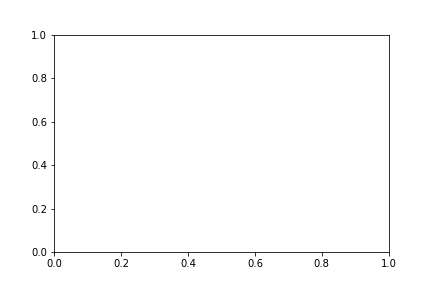

ValueError: x and y must have same first dimension, but have shapes (13,) and (12,)

In [79]:
plt.figure()
plt.plot(candidates.halfwidth, spFitted.halfwidth,".")

In [ ]:
import plotly.figure_factory as ff
import plotly.express as px

# px.set_mapbox_access_token(open(".mapbox_token").read())
# df = px.data.carshare()

In [190]:
px.scatter(data_frame=comb.iloc[:100], x="halfwidth", y="halfwidth_fitted")

In [198]:
HB.get_facecolors()

array([[0.0416, 0.    , 0.    , 1.    ],
       [0.0416, 0.    , 0.    , 1.    ],
       [0.0416, 0.    , 0.    , 1.    ],
       ...,
       [0.0416, 0.    , 0.    , 1.    ],
       [0.0416, 0.    , 0.    , 1.    ],
       [0.0416, 0.    , 0.    , 1.    ]])

In [200]:
del HB

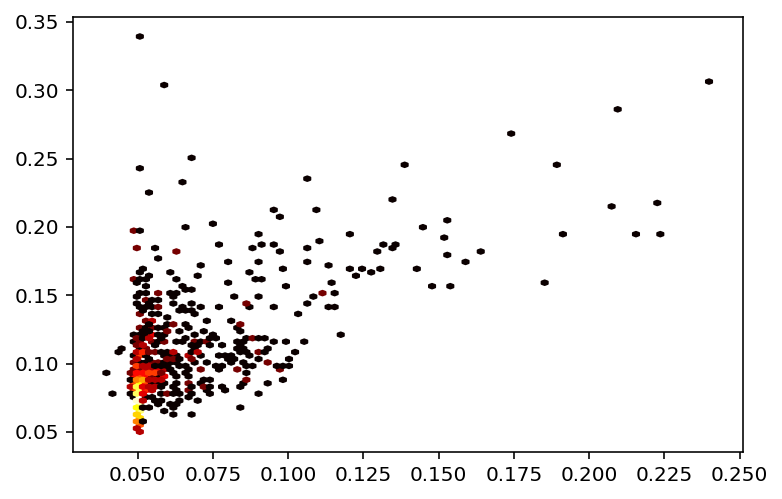

In [261]:
%run ~/new_islets/plotly_hexbin.py

tmp = hexbin(
    df = comb.iloc[:1000],
    x = "halfwidth",
    y = "halfwidth_fitted",
)


In [260]:
mpl_facecolors

NameError: name 'mpl_facecolors' is not defined

In [252]:
get_hexbin_attributes(tmp)[1]

array([[0.0446802 , 0.11094389],
       [0.04872465, 0.07542039],
       [0.04872465, 0.08049518],
       [0.04872465, 0.08556996],
       [0.04872465, 0.09064475],
       [0.04872465, 0.09571953],
       [0.04872465, 0.10079432],
       [0.04872465, 0.10586911],
       [0.04872465, 0.11601868],
       [0.04872465, 0.12109346],
       [0.04872465, 0.16169175],
       [0.04872465, 0.19721524],
       [0.05074688, 0.05004647],
       [0.05074688, 0.05512125],
       [0.05074688, 0.06019604],
       [0.05074688, 0.06527082],
       [0.05074688, 0.07034561],
       [0.05074688, 0.07542039],
       [0.05074688, 0.08049518],
       [0.05074688, 0.08556996],
       [0.05074688, 0.09064475],
       [0.05074688, 0.09571953],
       [0.05074688, 0.10079432],
       [0.05074688, 0.10586911],
       [0.05074688, 0.11094389],
       [0.05074688, 0.11601868],
       [0.05074688, 0.12109346],
       [0.05074688, 0.12616825],
       [0.05074688, 0.13631782],
       [0.05074688, 0.1413926 ],
       [0.

In [250]:
tmp.get_offsets().shape

(375, 2)

In [220]:
tmp.get_facecolors().shape

(375, 4)

In [221]:
tmp.get_array().shape

(375,)

In [233]:
del text, trace, layout, fig

In [223]:
get_hexbin_attributes(tmp)[1]

array([[0.0446802 , 0.11094389],
       [0.04872465, 0.07542039],
       [0.04872465, 0.08049518],
       [0.04872465, 0.08556996],
       [0.04872465, 0.09064475],
       [0.04872465, 0.09571953],
       [0.04872465, 0.10079432],
       [0.04872465, 0.10586911],
       [0.04872465, 0.11601868],
       [0.04872465, 0.12109346],
       [0.04872465, 0.16169175],
       [0.04872465, 0.19721524],
       [0.05074688, 0.05004647],
       [0.05074688, 0.05512125],
       [0.05074688, 0.06019604],
       [0.05074688, 0.06527082],
       [0.05074688, 0.07034561],
       [0.05074688, 0.07542039],
       [0.05074688, 0.08049518],
       [0.05074688, 0.08556996],
       [0.05074688, 0.09064475],
       [0.05074688, 0.09571953],
       [0.05074688, 0.10079432],
       [0.05074688, 0.10586911],
       [0.05074688, 0.11094389],
       [0.05074688, 0.11601868],
       [0.05074688, 0.12109346],
       [0.05074688, 0.12616825],
       [0.05074688, 0.13631782],
       [0.05074688, 0.1413926 ],
       [0.

In [216]:
tmp.get_array()

array([ 1.,  1.,  8.,  8.,  5.,  2.,  2.,  1.,  1.,  1.,  2.,  2.,  3.,
        8., 19., 40., 51., 72., 36., 24.,  8.,  2.,  1.,  7.,  1.,  2.,
        1.,  2.,  2.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  6.,  7.,
        5.,  3.,  1.,  1.,  2.,  1.,  1.,  2.,  1.,  2.,  1.,  1.,  1.,
        1.,  3.,  1.,  2.,  3.,  2.,  2.,  4.,  2.,  3.,  1.,  1.,  1.,
        1.,  1.,  1.,  4.,  2.,  1.,  1.,  1.,  1.,  2.,  1.,  2.,  1.,
        1.,  1.,  4.,  3.,  1.,  1.,  2.,  1.,  1.,  1.,  1.,  1.,  1.,
        1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  2.,
        1.,  1.,  1.,  1.,  1.,  2.,  2.,  1.,  1.,  3.,  1.,  1.,  1.,
        2.,  1.,  1.,  1.,  2.,  1.,  1.,  1.,  1.,  1.,  1.,  2.,  1.,
        1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  2.,  1.,
        1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
        2.,  1.,  1.,  1.,  1.,  1.,  2.,  1.,  1.,  1.,  1.,  1.,  1.,
        1.,  2.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1

In [61]:
fig = ff.create_hexbin_mapbox(
    data_frame=comb, lat="halfwidth", lon="halfwidth_fitted",
    nx_hexagon=100, opacity=0.5, labels={"color": "Point Count"},
    min_count=1,
)
# fig.show()
# fig

In [33]:
SPDF = pd.concat(regions.spikes.values(), ignore_index=True)

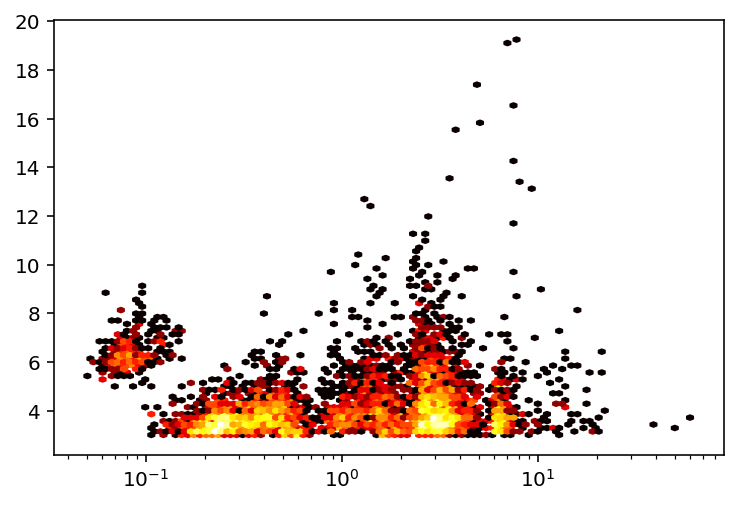

In [39]:
plt.hexbin(SPDF.halfwidth, SPDF.height, cmap="hot", bins="log", yscale="lin", xscale="log", mincnt=1)

In [40]:
regions.spikes["999"] = SPDF

In [164]:
# df = spikeDF.sort_values("halfwidth").iloc[-100:].copy()

In [165]:
# df["abundance"] = [(df.roi==roi).sum() for roi in df.roi]

In [161]:
regions.showTime.keys()

dict_keys([])

In [114]:
(spikeDF.roi.diff()!=0).cumsum()

0       1
1       1
2       1
3       1
4       1
       ..
415    58
416    59
417    59
418    59
419    59
Name: roi, Length: 420, dtype: int64

In [54]:
islets.LineScan?

In [55]:
ls = islets.LineScan(
    np.vstack(regions.df.trace),
    freq=regions.Freq
)

ImportError: cannot import name 'fit_debleach' from 'islets.numeric' (/home/srdjan/github/Physio_Ca/islets/numeric.py)

In [129]:
# ix = spikeDF.roi.value_counts().index[0]
ix = spikeDF.sort_values("height", ascending=False).roi.iloc[0]
# ix = spikeDF.sort_values("halfwidth", ascending=False).roi.iloc[0]
i = np.argmax(regions.df.index==ix)
t = regions.showTime.get(k, regions.time)
x = regions.df.loc[ix,prevcol]

In [130]:
candidates = spikeDF.query(f"roi=={ix}")

In [131]:
xf = s[i]/regions.df.loc[ix,"size"]/nRebin

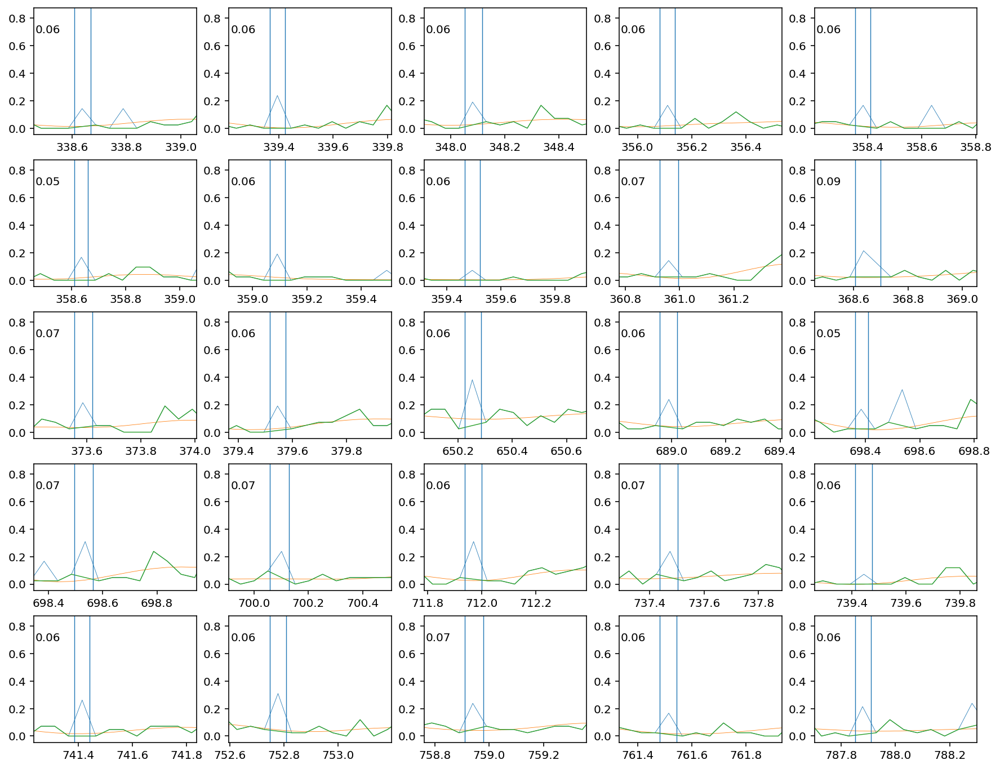

In [132]:
fig, axs = plt.subplots(5,5, figsize=(15,12), sharex=False, sharey=False)

ia=0
# for a_spike in [
#     candidates.sort_values("height").iloc[-1],
#     candidates.sort_values("halfwidth").iloc[-1],
# ]:
for _, a_spike in candidates.iloc[:25].iterrows():
    ax = axs.flat[ia]
    ax.plot(t,x,"-",lw=.4, label="hw=%.2f"%a_spike.halfwidth)
    ax.plot(islets.numeric.rebin(t, nRebin),xf,lw=.4)
    ax.plot(t,regions.df.loc[ix,currcol],lw=.7)
    ax.axvline(a_spike.t0, lw=.7)
    ax.axvline(a_spike.t0+a_spike.halfwidth, lw=.7)
    # i0 = np.searchsorted(t, a_spike.t0)-1
    # ie = np.searchsorted(t, a_spike.t0+a_spike.halfwidth*1.3)
    # plt.plot(t[i0:ie], x[i0:ie],".")
    # plt.plot([t[i0],t[ie]], [x[i0],x[ie]],"+")
    # corr = np.interp(t[i0:ie], [t[i0],t[ie]], [x[i0],x[ie]])
    # plt.plot(t[i0:ie], corr,".")
    # x_tmp = deepcopy(x)
    # x_tmp[i0:ie] = corr
    # plt.plot(t, regions.sosFilter.run(x_tmp))
    ax.set_xlim(a_spike.t0-ts/2, a_spike.t0+1.5*ts)
#     ax.legend(loc=4)
    ax.text(.01,.8, "%.2f"%a_spike.halfwidth, transform=ax.transAxes)
    ia += 1

In [176]:
type(Out)

dict

In [184]:
del Out[166]

#### Next filtering at 2

In [74]:
z_th = 4
ts = 3
k = "%g"%ts
currcol = "trace_"+k
smooth = True
regions.df[currcol] = [tr.copy() for tr in regions.df[]]

/home/srdjan/github/Physio_Ca/islets/Regions.py:966: RuntimeWarning: invalid value encountered in sqrt
  std = var**.5
/home/srdjan/github/Physio_Ca/islets/Regions.py:990: RuntimeWarning: invalid value encountered in sqrt
  std = var**.5
/home/srdjan/github/Physio_Ca/islets/Regions.py:1073: RuntimeWarning: Mean of empty slice
  zScores = runningAverage(zScores.T,smooth).T
/home/srdjan/github/Physio_Ca/islets/Regions.py:966: RuntimeWarning: invalid value encountered in sqrt
  std = var**.5
/home/srdjan/github/Physio_Ca/islets/Regions.py:990: RuntimeWarning: invalid value encountered in sqrt
  std = var**.5
/home/srdjan/github/Physio_Ca/islets/Regions.py:1073: RuntimeWarning: Mean of empty slice
  zScores = runningAverage(zScores.T,smooth).T
/home/srdjan/github/Physio_Ca/islets/Regions.py:966: RuntimeWarning: invalid value encountered in sqrt
  std = var**.5
/home/srdjan/github/Physio_Ca/islets/Regions.py:990: RuntimeWarning: invalid value encountered in sqrt
  std = var**.5
/home/srdjan

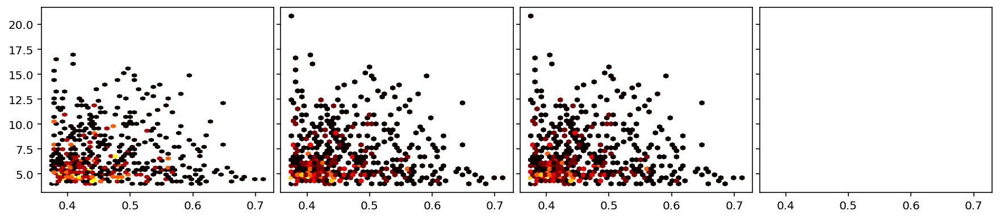

In [75]:
fig, axs = plt.subplots(1,4,figsize=(15,3), sharex=True, sharey=True)
for ia in range(3):
    ax = axs.flat[ia]
    s,f,z = regions.fast_filter_traces(ts, usecol=currcol, write=False, normalize=False, z_sp=z_th)
    regions.calc_spikes(ts,z_th=z_th, zScores=z, smooth=smooth)
    t = regions.showTime.get(k, regions.time)
    spikeDF = regions.spikes[k]
    spikeDF = spikeDF.query(f"halfwidth<{ts/2}")
    ax.hexbin(*spikeDF.iloc[:,[1,0]].values.T, 
    #            bins="log",
               cmap="hot",
               mincnt=1,
               gridsize=50
              )
    for _, spike in spikeDF.iterrows():
        i0 = np.searchsorted(t, spike.t0)-1
        ie = np.searchsorted(t, spike.t0+spike.halfwidth*1.05)
        x = regions.df.loc[spike.roi,currcol]
        corr = np.interp(t[i0:ie], [t[i0],t[ie]], [x[i0],x[ie]])
        x[i0:ie] = corr
plt.subplots_adjust(wspace=.03)

In [76]:
tr = np.vstack([ regions.df.loc[ix,"trace"]*regions.df.loc[ix,"size"] for ix in regions.df.index])

In [77]:
# s[s<=0] = 1e-2

In [78]:
z = (tr-s)/(s*regions.gain+1e-2)**.5

ValueError: operands could not be broadcast together with shapes (264,53459) (264,13364) 

In [63]:
regions.calc_spikes(ts,z_th=z_th, zScores=z, verbose=True, smooth=smooth)

In [64]:
spikeDF = regions.spikes[k]

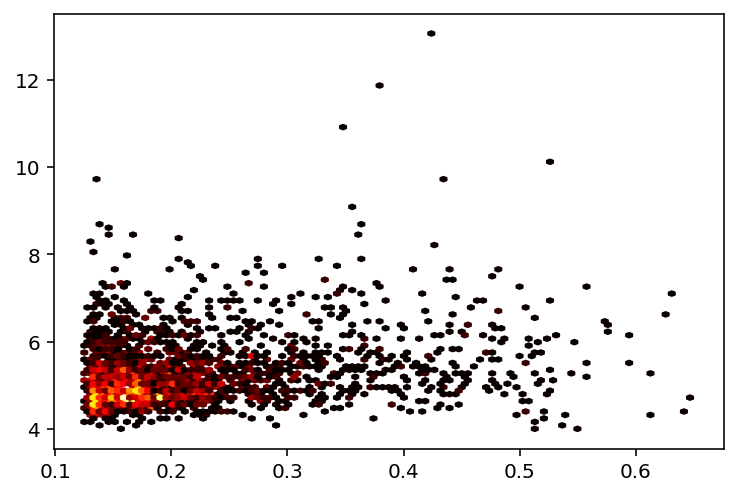

In [65]:
plt.hexbin(*spikeDF.iloc[:,[1,0]].values.T, 
#            bins="log",
           cmap="hot",
           mincnt=1,
#            gridsize=50,
#            yscale="log"
          )


In [66]:
# ix = spikeDF.roi.value_counts().index[0]
ix = spikeDF.sort_values("height", ascending=False).roi.iloc[0]
# ix = spikeDF.sort_values("halfwidth", ascending=False).roi.iloc[0]
i = np.argmax(regions.df.index==ix)
t = regions.time
x = regions.df.loc[ix,"trace"]

In [67]:
candidates = spikeDF.query(f"roi=={ix}")

In [68]:
xf = s[i]/regions.df.loc[ix,"size"]

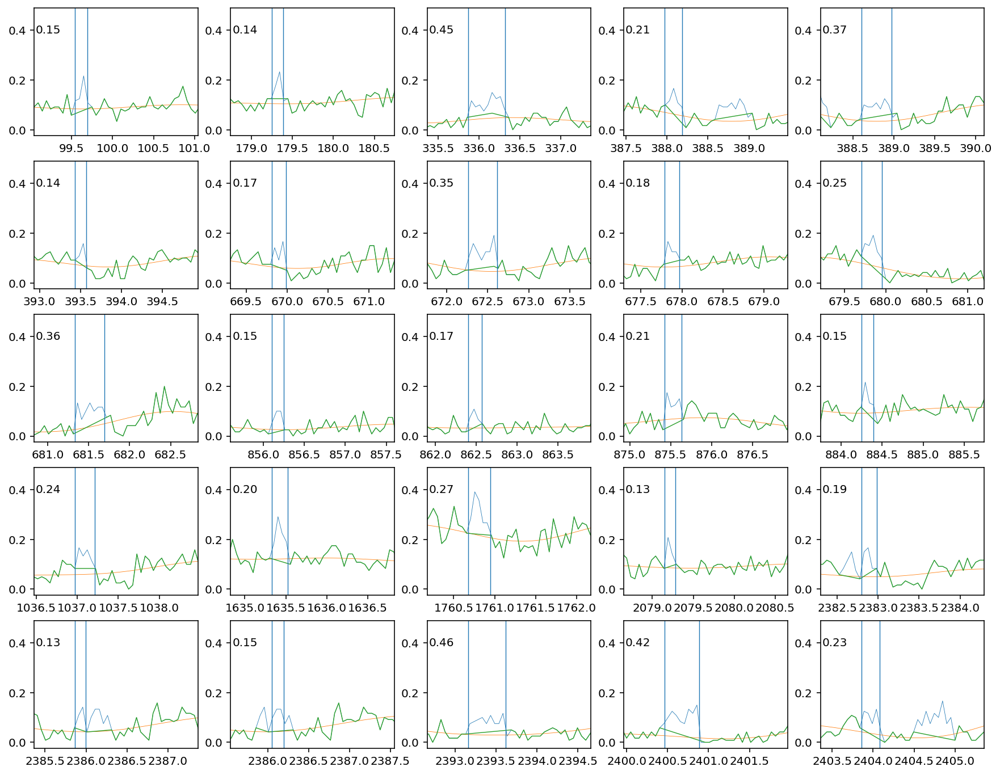

In [69]:
fig, axs = plt.subplots(5,5, figsize=(15,12))

ia=0
# for a_spike in [
#     candidates.sort_values("height").iloc[-1],
#     candidates.sort_values("halfwidth").iloc[-1],
# ]:
for _, a_spike in candidates.iloc[:25].iterrows():
    ax = axs.flat[ia]
    ax.plot(t,x,"-",lw=.4, label="hw=%.2f"%a_spike.halfwidth)
    ax.plot(t,xf,lw=.4)
    ax.plot(t,regions.df.loc[ix,currcol],lw=.7)
    ax.axvline(a_spike.t0, lw=.7)
    ax.axvline(a_spike.t0+a_spike.halfwidth, lw=.7)
    # i0 = np.searchsorted(t, a_spike.t0)-1
    # ie = np.searchsorted(t, a_spike.t0+a_spike.halfwidth*1.3)
    # plt.plot(t[i0:ie], x[i0:ie],".")
    # plt.plot([t[i0],t[ie]], [x[i0],x[ie]],"+")
    # corr = np.interp(t[i0:ie], [t[i0],t[ie]], [x[i0],x[ie]])
    # plt.plot(t[i0:ie], corr,".")
    # x_tmp = deepcopy(x)
    # x_tmp[i0:ie] = corr
    # plt.plot(t, regions.sosFilter.run(x_tmp))
    ax.set_xlim(a_spike.t0-ts/2, a_spike.t0+1.5*ts)
#     ax.legend(loc=4)
    ax.text(.01,.8, "%.2f"%a_spike.halfwidth, transform=ax.transAxes)
    ia += 1

In [68]:
%matplotlib notebook

<IPython.core.display.Javascript object>


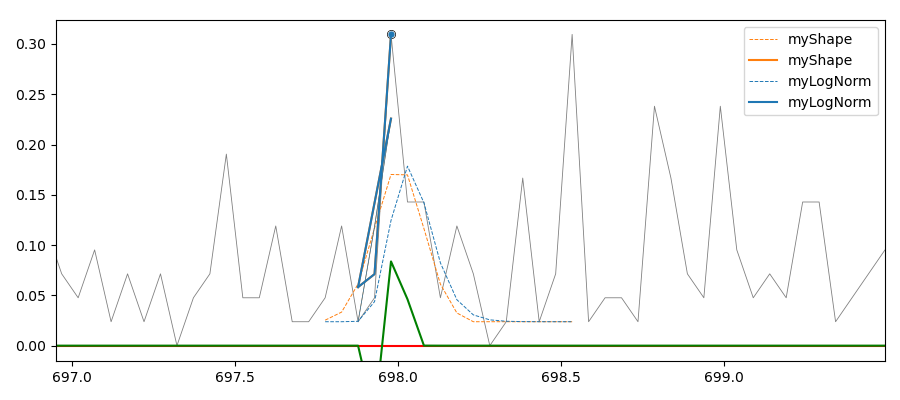

/opt/tljh/user/envs/physio_dev/lib/python3.7/site-packages/scipy/optimize/_numdiff.py:519: RuntimeWarning: invalid value encountered in true_divide
  J_transposed[i] = df / dx
/opt/tljh/user/envs/physio_dev/lib/python3.7/site-packages/scipy/optimize/_numdiff.py:519: RuntimeWarning: invalid value encountered in true_divide
  J_transposed[i] = df / dx
/opt/tljh/user/envs/physio_dev/lib/python3.7/site-packages/scipy/optimize/_numdiff.py:519: RuntimeWarning: invalid value encountered in true_divide
  J_transposed[i] = df / dx
/opt/tljh/user/envs/physio_dev/lib/python3.7/site-packages/scipy/optimize/_numdiff.py:519: RuntimeWarning: invalid value encountered in true_divide
  J_transposed[i] = df / dx
/opt/tljh/user/envs/physio_dev/lib/python3.7/site-packages/scipy/optimize/_numdiff.py:519: RuntimeWarning: invalid value encountered in true_divide
  J_transposed[i] = df / dx
/opt/tljh/user/envs/physio_dev/lib/python3.7/site-packages/scipy/optimize/_numdiff.py:519: RuntimeWarning: invalid value

In [76]:
ifit = len(candidates)-1
nshow = np.searchsorted(t, candidates.iloc[ifit].t0+1)
fittedSpikes = islets.fit_spikes(t[:nshow], x[:nshow], candidates, ifit=ifit, plot=True)

In [78]:
fittedSpikes

,fshape,pars,score,background,half_width,amplitude,loc
38,myShape,"(361.3285636791426, 0.2023809552192688, 5050.5...",0.000989,0.010550,0.172361,0.188021,361.328564
39,myShape,"(373.87725603619884, 0.095238097012043, 5050.5...",0.003552,0.005083,0.155511,0.089122,373.877256
40,myShape,"(382.6262593087674, 0.1190476231276989, 5050.5...",0.001365,0.007528,0.146853,0.108865,382.626259
41,myLogNorm,"(388.9684390336361, 0.2751386739531551, 1.2232...",0.023493,0.149270,0.053087,0.196686,388.968439
42,myLogNorm,"(691.1380999562232, 0.2422367832632, 0.1188897...",0.002411,0.048758,0.092640,0.234974,691.138100
43,myLogNorm,"(697.9811133427252, 0.30094110143282443, 0.228...",0.021859,0.142016,NaN,0.083751,697.981113
44,myShape,"(704.5628090069581, 0.14285715017467737, 5050....",0.004216,0.006215,0.199125,0.136006,704.562809
45,myShape,"(708.6631470753975, 0.1785714328289032, 5050.5...",0.001936,0.013942,0.135071,0.156168,708.663147
46,myShape,"(745.9773243324113, 0.20522744624100708, 5050....",0.003124,0.053845,0.102228,0.178798,745.977324
47,myShape,"(777.3883180867373, 0.3025648633241047, 5050.5...",0.015305,0.071529,NaN,0.023910,777.388318


In [79]:
plt.plot(t, islets.fitting.multiShape(t, fittedSpikes.loc[[41,43]]), color="g")

In [ ]:
plt.plot(t, )

In [34]:
islets.fit_spikes?

<IPython.core.display.Javascript object>


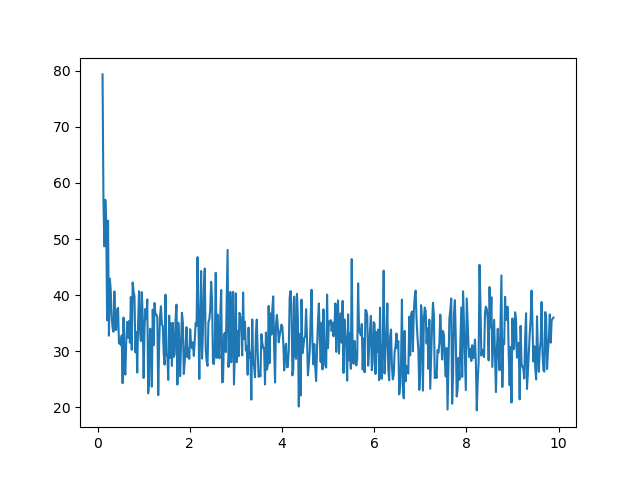

In [60]:
plt.figure()
f,pw = islets.numeric.rebin(np.array(islets.numeric.power_spectrum(x[:10000], 1/(t[1]-t[0]))),10,1)
plt.plot(f[f>.1],pw[f>.1])

In [62]:
regions.spikes2raster?

In [ ]:
raster = regions.spikes2raster(1)

In [93]:
regions.reset_filtered()

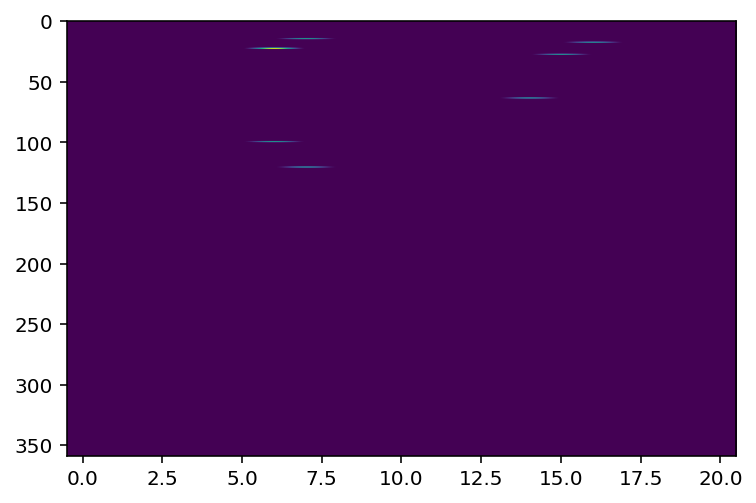

In [89]:
plt.imshow(rebin(raster,1000,1), aspect="auto")

In [27]:
from islets.general_functions import autocorr

In [77]:
ac = np.array([autocorr(r,[2,3,4]).mean() for r in raster])

/opt/tljh/user/envs/physio_dev/lib/python3.7/site-packages/numpy/lib/function_base.py:2559: RuntimeWarning:

invalid value encountered in true_divide



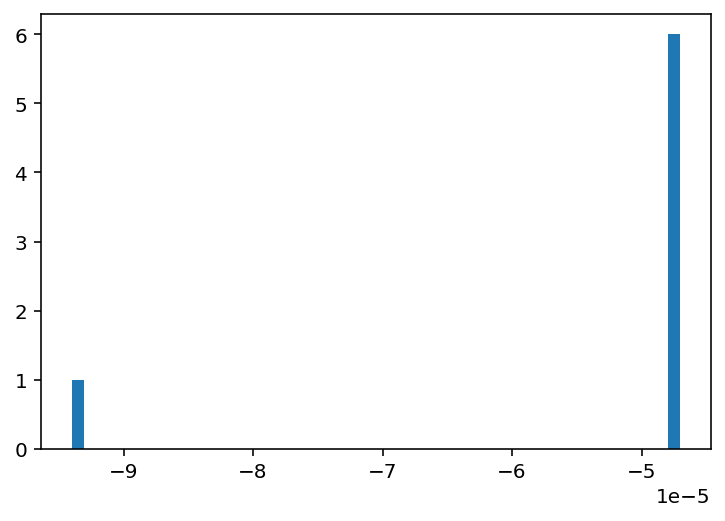

In [78]:
plt.hist(ac,50);

In [79]:
ix_anticorr = np.argpartition(ac,10)[:10]
ix_corr = np.argpartition(-ac,10)[:10]

/opt/tljh/user/envs/physio_dev/lib/python3.7/site-packages/numpy/lib/function_base.py:2559: RuntimeWarning:

invalid value encountered in true_divide

/opt/tljh/user/envs/physio_dev/lib/python3.7/site-packages/numpy/lib/function_base.py:2559: RuntimeWarning:

invalid value encountered in true_divide

/opt/tljh/user/envs/physio_dev/lib/python3.7/site-packages/numpy/lib/function_base.py:2559: RuntimeWarning:

invalid value encountered in true_divide



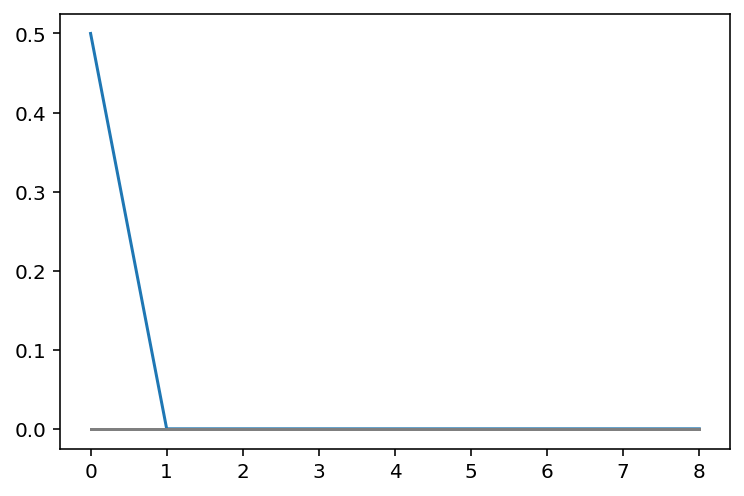

In [80]:
plt.figure()
for r in raster[ix_anticorr]:
    plt.plot(autocorr(r, np.arange(1,10)))

In [81]:
idx_anticorr = regions.df.index[ix_anticorr]

In [82]:
idx_corr = regions.df.index[ix_corr]

In [83]:
from islets.utils import showRoisOnly

In [84]:
regions.examine(
#     startShow=idx_anticorr
    startShow=idx_corr
               )

(0.0, 100.0)

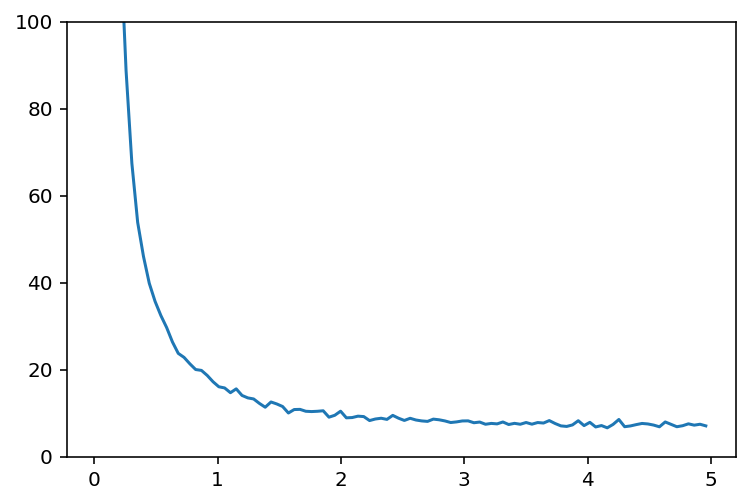

In [85]:
plt.plot(*rebin(np.array(power_spectrum(np.vstack(regions.df.trace[idx_corr]), regions.Freq)),100,1))
plt.ylim(0,100)

In [ ]:
i = 218
plt.figure(figsize=(15,7))

if k in regions.showTime:
    time = regions.showTime[k]
else:
    time = regions.time
ip = 0
for j in [i]+regions.df.neighbors[i]:
    nr = int(len(regions.time)/len(time))
    x = rebin(regions.df.loc[j,"trace"],nr)
    offset =ip*1
    x = x + offset
    xs = regions.df.loc[j,"slower_"+k]+offset
    c = plt.plot(time, x)[0].get_color()
    plt.plot(time, xs,c=c)
    ip += 1

In [ ]:
islets.__version__

In [ ]:
from islets.numeric import 

In [ ]:
import islets

In [ ]:
islets.__dict__.keys()

In [ ]:
from islets import fit_spikes

In [ ]:
del islets

In [ ]:
import sys

In [ ]:
sys.path.append("/home/jupyter-srdjan/new_islets/")

In [ ]:
from islets import fitting

In [ ]:
from islets.fitting import fit_spikes

In [ ]:
regions.gain

In [ ]:
plt.figure()
x = regions.df.detrended[105]
sf = regions.sosFilter
xx = sf.run(x)
plt.plot(*rebin(np.array(power_spectrum(x,regions.Freq)),100,1))
plt.plot(*rebin(np.array(power_spectrum(xx,regions.Freq)),100,1))
plt.yscale("log")
# plt.twinx()
# plt.plot(*sf.get_shape(),color="grey", ls="--")
# # plt.yscale("log")
# plt.ylim(-1e-4,3)

In [ ]:
regions.plotTraces(regions.df.sort_values("interest").index[-30:], col="detrended")

In [ ]:
i = 86
regions.plotTraces([i]+regions.df.neighbors[i], col="detrended")

In [ ]:
# regions.fast_filter_traces(100, z_sp=3.5, Npoints=np.inf)

In [ ]:
# regions.plotTraces(regions.df.sort_values("interest",ascending=False).index[19:37], Offset=4, col="faster_299")

In [ ]:
ts1 = 15
regions.calc_peaks(ts1, z_th=10)
raster1, = regions.peaks2raster(ts1, onlyRaster=True, npoints=len(regions.time))

ts2 = 3
regions.calc_peaks(ts1, z_th=2)
raster2, = regions.peaks2raster(ts2, onlyRaster=True, npoints=len(regions.time))

In [ ]:
import matplotlib.colors as mcolors

colors = [(1,0,0,c) for c in np.linspace(0,1,100)]
cmapred = mcolors.LinearSegmentedColormap.from_list('mycmap', colors, N=5)


colors = [(0,0,1,c) for c in np.linspace(0,1,100)]
cmapblue = mcolors.LinearSegmentedColormap.from_list('mycmap', colors, N=5)
colors = [(0,0,0,c) for c in np.linspace(0,1,100)]
cmapblack = mcolors.LinearSegmentedColormap.from_list('mycmap', colors, N=5)
colors = [(1,0,1,c) for c in np.linspace(0,1,100)]
cmappink = mcolors.LinearSegmentedColormap.from_list('mycmap', colors, N=5)
colors = [(0,1,1,c) for c in np.linspace(0,1,100)]
cmapcyan = mcolors.LinearSegmentedColormap.from_list('mycmap', colors, N=5)

In [ ]:
plt.figure(figsize=(16,3))
plt.imshow(raster1, cmap=cmapblue, extent=(0,regions.time.max(),-0.5,regions.df.shape[0]))
plt.imshow(raster2, cmap=cmapblack, extent=(0,regions.time.max(),-0.5,regions.df.shape[0]))
#plt.ylabel("ROI number")
#plt.xlabel("time [s]")
plt.gca().set_aspect("auto")

timeTags = []


for tag in timeTags:
    plt.axvline(tag,color="gray")
    
#plt.xlim(0,1000)
#plt.ylim(20,70)
plt.yticks([])
plt.axis('off')

In [ ]:
plt.figure(figsize=(8,2))
plt.imshow(raster1, cmap=cmapblue, extent=(0,regions.time.max(),-0.5,regions.df.shape[0]))
plt.imshow(raster2, cmap=cmapblack, extent=(0,regions.time.max(),-0.5,regions.df.shape[0]))
plt.gca().set_aspect("auto")

plt.xlim(710,1110)
#plt.ylim(20,70)
plt.yticks([])
plt.xticks([])

In [ ]:
plt.figure(figsize=(8,2))
plt.imshow(raster1, cmap=cmapblue, extent=(0,regions.time.max(),-0.5,regions.df.shape[0]))
plt.imshow(raster2, cmap=cmapblack, extent=(0,regions.time.max(),-0.5,regions.df.shape[0]))
plt.gca().set_aspect("auto")

plt.xlim(1300,1700)
plt.ylim(20,70)
plt.xticks([])
plt.yticks([])

In [ ]:
plt.figure(figsize=(5,1.5))
plt.imshow(raster1, cmap=cmapblue, extent=(0,regions.time.max(),-0.5,regions.df.shape[0]))
plt.imshow(raster2, cmap=cmapgreen, extent=(0,regions.time.max(),-0.5,regions.df.shape[0]))
plt.gca().set_aspect("auto")

plt.xlim(3220,3420)
plt.ylim(20,70)

In [ ]:
sumspins = []
for i in range(len(raster1)):
    xpos = np.where(raster1[i]>0)[0]    
    sumspins.append(xpos)

aa = np.hstack(sumspins)

plt.figure(figsize=(20,5))
plt.hist(aa, bins=10000, fill=True)

timeTags = [1476.0, 2340.0, 3812.0, 5341.0]


for tag in timeTags:
    plt.axvline(tag,color="gray")
    
#plt.ylim(0,25)

In [ ]:
showOnly = regions.df.sort_values("interest",ascending=False).index[0:20]
#showOnly = regions.df.index[322:324]
#showOnly = [186,189,229,235,179,168,208,178,183,140,210,188]

In [ ]:
regions.plotTraces(showOnly, figsize=10, freqShow=1, col='faster_299', Offset=2, separate=True)

In [ ]:
from islets.Recording1 import Recording

In [ ]:
pd.set_option('display.max_rows', 500)

In [ ]:
rec = Recording(pathToPickle.split("_analysis")[0])
rec.metadata["Diff Start"] = rec.metadata["Start time"].diff()
rec.metadata

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
nRebin = 30
plt.figure(figsize=(8,4))
plt.plot(rebin(regions.time, nRebin), rebin(regions.df.faster_299[86], nRebin))

timeTags = [697]
plt.xlabel("time [s]")

for tag in timeTags:
    plt.axvline(tag,color="gray")
    
plt.xlim(0,2127)
plt.yticks([])
plt.ylim(-4,8)

In [ ]:
nRebin = 20
plt.figure(figsize=(3.5,2))
plt.plot(rebin(regions.time, nRebin), rebin(regions.df.faster_299[86], nRebin))

plt.xlim(710,1100)
plt.ylim(-1.3,3.8)
plt.yticks([])
plt.xticks([])

In [ ]:
nRebin = 20
plt.figure(figsize=(3.5,2))
plt.plot(rebin(regions.time, nRebin), rebin(regions.df.faster_299[86], nRebin))

plt.xlim(1300,1700)
plt.ylim(-1.3,3.8)
plt.yticks([])
plt.xticks([])

In [ ]:
nRebin = 10
plt.figure(figsize=(5,3))
plt.plot(rebin(regions.time, nRebin), rebin(regions.df.faster_1699[187], nRebin))

plt.xlim(3075,3375)
plt.ylim(-.5,4)
plt.yticks([])